In [ ]:
!pip install pmdarima
!pip install arch
!pip install pytorch-lightning==1.9.5
!pip install tqdm==4.66.4
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.autograd as autograd
import torch.optim as optimal_lags
from torch.utils.data import Dataset, DataLoader
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.tsa.statespace.sarimax
import pmdarima as pm
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import statsmodels.api as sm
from tqdm.notebook import tqdm

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [ ]:
tqdm.pandas()
data = pd.read_csv('GOOGL.csv')
data = data[['Date', 'Close']]
data

,Date,Close
0,2023-06-07,122.500000
1,2023-06-08,122.139999
2,2023-06-09,122.230003
3,2023-06-12,123.639999
4,2023-06-13,123.830002
...,...,...
247,2024-05-31,172.500000
248,2024-06-03,173.169998
249,2024-06-04,173.789993
250,2024-06-05,175.410004


        Date       Close
0 2023-06-07  122.500000
1 2023-06-08  122.139999
2 2023-06-09  122.230003
3 2023-06-12  123.639999
4 2023-06-13  123.830002


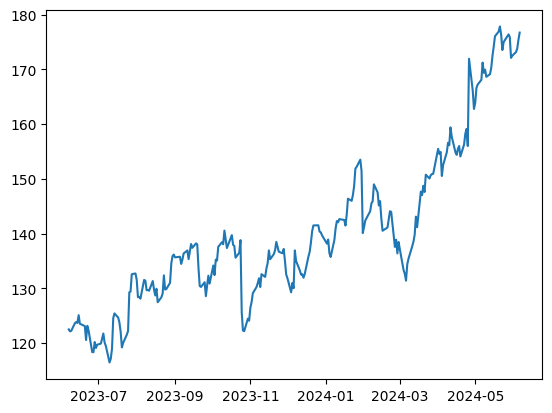

In [ ]:
data['Date'] = pd.to_datetime(data['Date'])
plt.plot(data['Date'], data['Close'])
print(data.head(5))

In [ ]:
df = data

df["Date"] = pd.to_datetime(df["Date"])

df.set_index("Date", inplace=True)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 201 entries, 2023-06-07 to 2024-03-25
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   201 non-null    float64
dtypes: float64(1)
memory usage: 3.1 KB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 51 entries, 2024-03-26 to 2024-06-06
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   51 non-null     float64
dtypes: float64(1)
memory usage: 816.0 bytes
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 209 entries, 2023-06-07 to 2024-03-25
Freq: B
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Close   209 non-null    float64
dtypes: float64(1)
memory usage: 3.3 KB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 53 entries, 2024-03-26 to 2024-06-06
Freq: B
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  

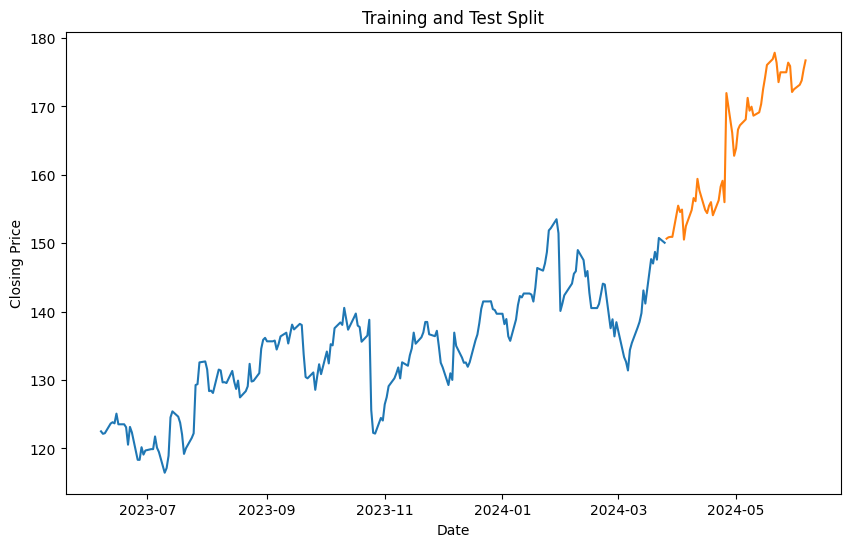

In [ ]:
split_index = int(len(df) * 0.80)
df_train = df[:split_index]
df_test = df[split_index:]

# Drop NaNs (optional, based on your data handling strategy)
df_train = df_train.dropna()
df_test = df_test.dropna()

df_train.info()
df_test.info()

# Ensure index for 'df_train' and 'df_test' is datetime and set frequency again
df_train.index = pd.to_datetime(df_train.index)
df_train = df_train.asfreq('B')
df_test.index = pd.to_datetime(df_test.index)
df_test = df_test.asfreq('B')
df_train = df_train.fillna(method='ffill')
df_test = df_test.fillna(method='ffill')
# Print info
df_train.info()
df_test.info()

# Check frequency
print("Frequency of df_train:", df_train.index.freq)

plt.figure(figsize=(10, 6))
plt.plot(df_train)
plt.plot(df_test)
plt.title('Training and Test Split')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.show()

p-value of ADF test: 0.8519220773074287
Ljung-Box test:
        lb_stat  lb_pvalue
10  1944.215967        0.0
Box-Pierce test:
Q-statistic: 2207.135549753074, p-value: 0.0
Phillips-Perron test:
     Phillips-Perron Test (Z-tau)    
Test Statistic                 -0.227
P-value                         0.935
Lags                               16
-------------------------------------

Trend: Constant
Critical Values: -3.46 (1%), -2.87 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.
(0.26343361139139093, 0.01, 10, {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})


<ipython-input-1583-0d84ea8b570f>:32: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  print(sm.tsa.stattools.kpss(log_df, regression='ct'))


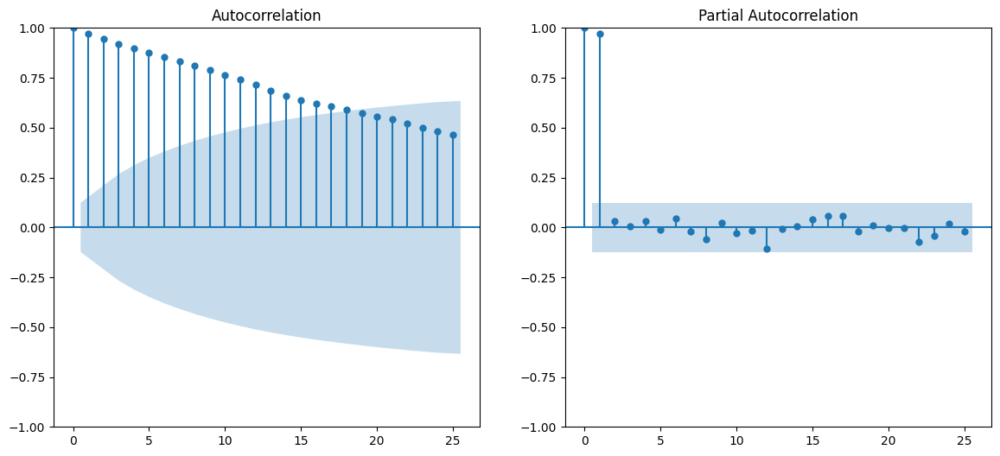

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, acf, pacf, q_stat
from statsmodels.stats.diagnostic import acorr_ljungbox, acorr_breusch_godfrey
from arch.unitroot import PhillipsPerron

log_df= np.log(df)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

plot_acf(df['Close'], ax=axes[0])

plot_pacf(df['Close'], ax=axes[1])
adf_test = adfuller(log_df)
print(f'p-value of ADF test: {adf_test[1]}')

# Ljung-Box test
ljung_box_test = acorr_ljungbox(log_df, lags=[10], return_df=True)
print('Ljung-Box test:')
print(ljung_box_test)

# Box-Pierce test
box_pierce_test = q_stat(acf(log_df, nlags=10), len(log_df))
print('Box-Pierce test:')
print(f'Q-statistic: {box_pierce_test[0][-1]}, p-value: {box_pierce_test[1][-1]}')

# Phillips-Perron test
pp_test = PhillipsPerron(log_df)
print('Phillips-Perron test:')
print(pp_test)
#kpss = KPSS()
#print(kpss.summary().as_text())
print(sm.tsa.stattools.kpss(log_df, regression='ct'))

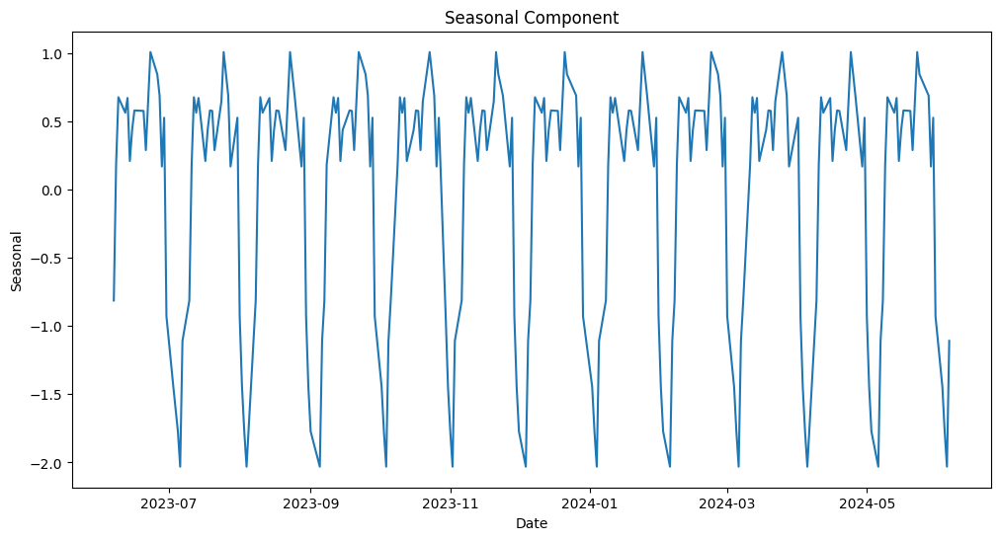

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
adfuller(log_df["Close"]) #p > 0.1 acceptam H0
result = seasonal_decompose(df['Close'], model='additive', period=21)  # Adjust period as per your data frequency

# Extracting and plotting the seasonal component
seasonal = result.seasonal
plt.figure(figsize=(12, 6))
plt.plot(seasonal)
plt.title('Seasonal Component')
plt.xlabel('Date')
plt.ylabel('Seasonal')
plt.show()


Index type: <class 'pandas.core.indexes.datetimes.DatetimeIndex'>
Frequency: None


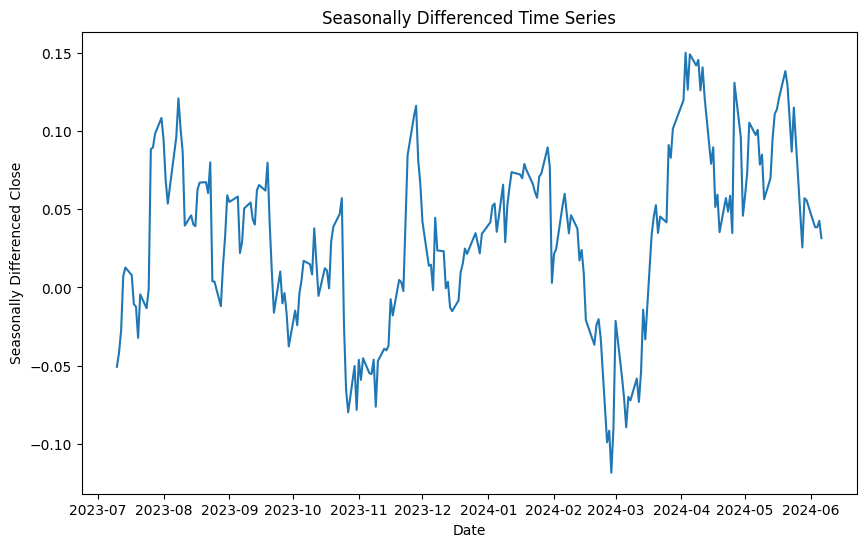

In [ ]:

print("Index type:", type(df.index))
print("Frequency:", df.index.freq)

seasonal_diff = log_df['Close'].diff(21).dropna()
plt.figure(figsize=(10, 6))
plt.plot(seasonal_diff)
plt.title('Seasonally Differenced Time Series')
plt.xlabel('Date')
plt.ylabel('Seasonally Differenced Close')
plt.show()

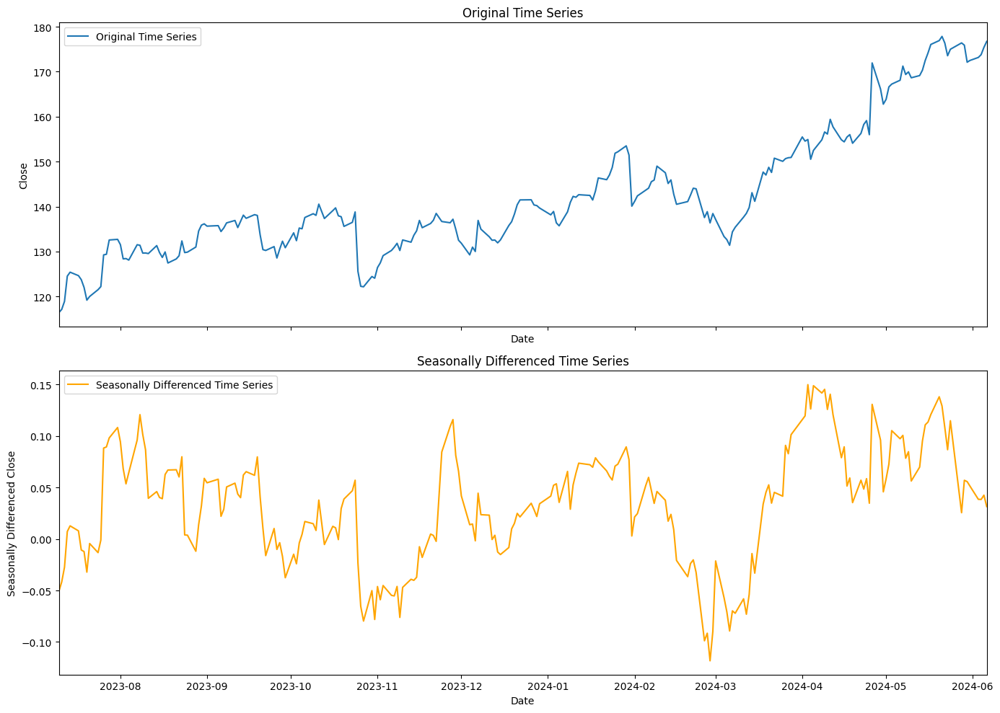

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# Plot the original time series, adjusting to the date range of the seasonally adjusted series
axes[0].plot(df['Close'], label='Original Time Series')
axes[0].set_xlim(seasonal_diff.index.min(), seasonal_diff.index.max())
axes[0].set_title('Original Time Series')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Close')
axes[0].legend()

# Plot the seasonally differenced time series
axes[1].plot(seasonal_diff, label='Seasonally Differenced Time Series', color='orange')
axes[1].set_title('Seasonally Differenced Time Series')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Seasonally Differenced Close')
axes[1].legend()
# Adjust layout
plt.tight_layout()
plt.show()

p-value of ADF test: 0.001616094756482666
Ljung-Box test:
       lb_stat      lb_pvalue
10  893.940686  1.282464e-185
Box-Pierce test:
Q-statistic: 1232.046086048599, p-value: 2.0049343425904556e-257
Phillips-Perron test:
     Phillips-Perron Test (Z-tau)    
Test Statistic                 -3.847
P-value                         0.002
Lags                               15
-------------------------------------

Trend: Constant
Critical Values: -3.46 (1%), -2.87 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.
(0.142915133718434, 0.05571271533623331, 9, {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})


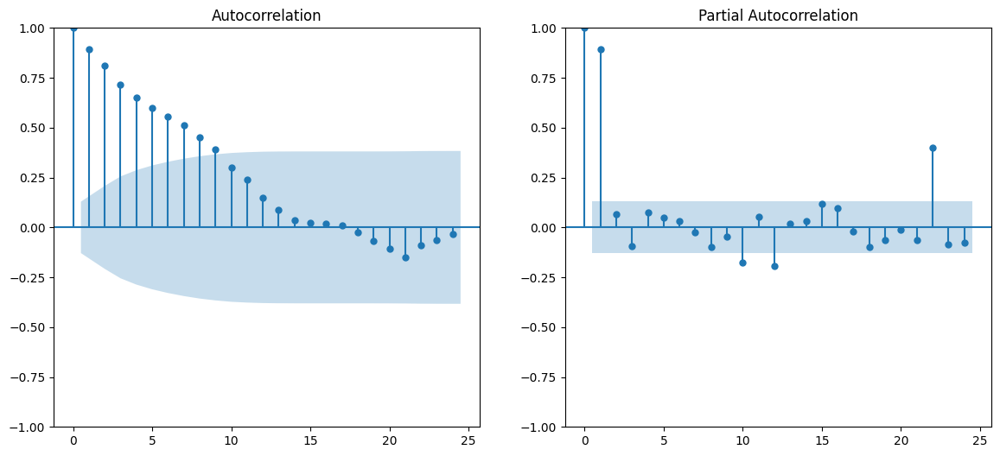

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

plot_acf(seasonal_diff, ax=axes[0])

plot_pacf(seasonal_diff, ax=axes[1])

adf_test = adfuller(seasonal_diff)
print(f'p-value of ADF test: {adf_test[1]}')

# Ljung-Box test
ljung_box_test = acorr_ljungbox(seasonal_diff, lags=[10], return_df=True)
print('Ljung-Box test:')
print(ljung_box_test)

# Box-Pierce test
box_pierce_test = q_stat(acf(seasonal_diff, nlags=10), len(log_df))
print('Box-Pierce test:')
print(f'Q-statistic: {box_pierce_test[0][-1]}, p-value: {box_pierce_test[1][-1]}')

# Phillips-Perron test
pp_test = PhillipsPerron(seasonal_diff)
print('Phillips-Perron test:')
print(pp_test)
#kpss = KPSS()
#print(kpss.summary().as_text())
print(sm.tsa.stattools.kpss(seasonal_diff, regression='ct'))

Frequency of diff_close: None


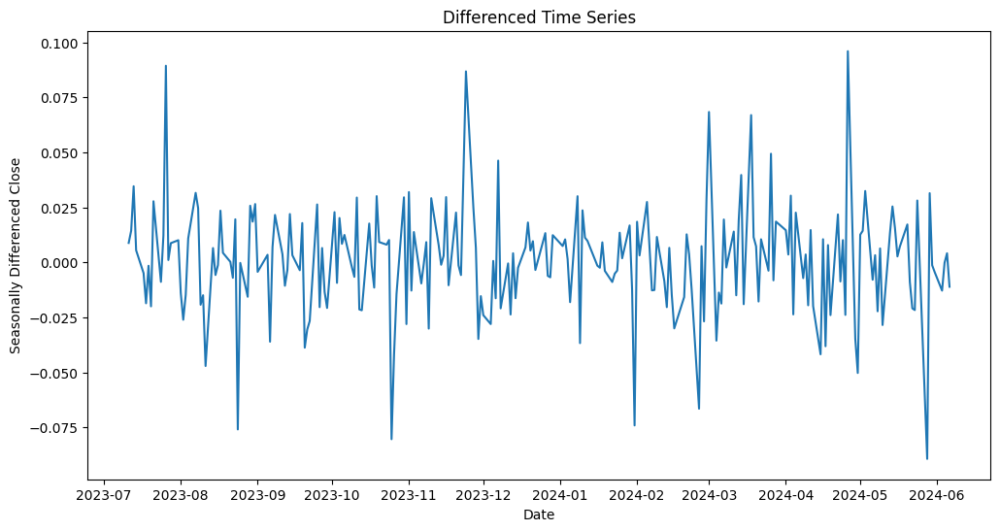

p-value of ADF test: 4.569624911191666e-06
Ljung-Box test:
      lb_stat  lb_pvalue
10  22.591678   0.012358
Box-Pierce test:
Q-statistic: 279.78396913651414, p-value: 1.5739425666478492e-53
Phillips-Perron test:
     Phillips-Perron Test (Z-tau)    
Test Statistic                -17.306
P-value                         0.000
Lags                               15
-------------------------------------

Trend: Constant
Critical Values: -3.46 (1%), -2.87 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.
(0.042040159422529734, 0.1, 7, {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})


<ipython-input-1588-37eca56f4ad7>:37: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  print(sm.tsa.stattools.kpss(diff_df, regression='ct'))


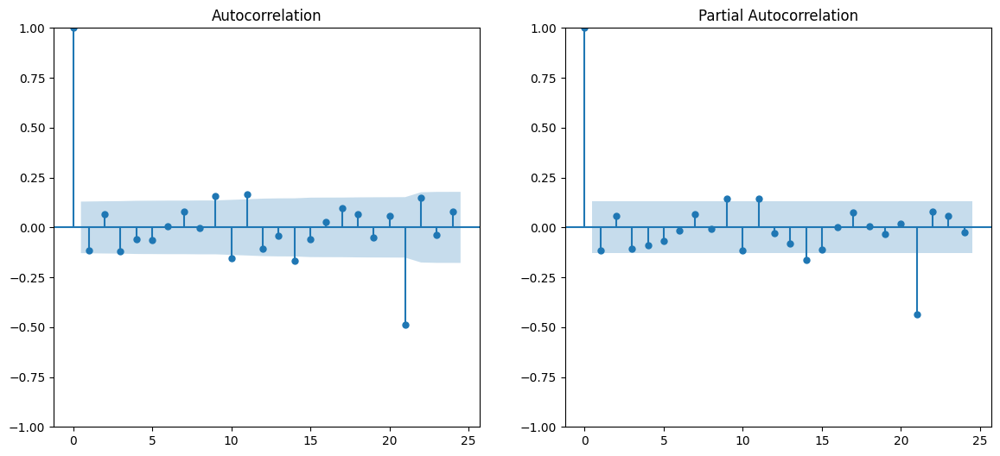

In [ ]:
diff_df = seasonal_diff.diff().dropna()

print("Frequency of diff_close:", diff_df.index.freq)

plt.figure(figsize=(12, 6))
plt.plot(diff_df)
plt.title('Differenced Time Series')
plt.xlabel('Date')
plt.ylabel('Seasonally Differenced Close')
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

plot_acf(diff_df, ax=axes[0])

plot_pacf(diff_df, ax=axes[1])

adf_test = adfuller(diff_df)
print(f'p-value of ADF test: {adf_test[1]}')

# Ljung-Box test
ljung_box_test = acorr_ljungbox(diff_df, lags=[10], return_df=True)
print('Ljung-Box test:')
print(ljung_box_test)

# Box-Pierce test
box_pierce_test = q_stat(acf(diff_df, nlags=10), len(log_df))
print('Box-Pierce test:')
print(f'Q-statistic: {box_pierce_test[0][-1]}, p-value: {box_pierce_test[1][-1]}')

# Phillips-Perron test
pp_test = PhillipsPerron(diff_df)
print('Phillips-Perron test:')
print(pp_test)
#kpss = KPSS()
#print(kpss.summary().as_text())
print(sm.tsa.stattools.kpss(diff_df, regression='ct'))

In [ ]:
import pmdarima as pm
#diff_close.index = pd.DatetimeIndex(diff_close.index).to_period('M')
model = sm.tsa.statespace.SARIMAX(df_train, order=(1,1,0), seasonal_order=(1,1,0,21))
#model = sm.tsa.statespace.SARIMAX(df_train, order=(0,1,1), seasonal_order=(0,0,0,21))
model_fit = model.fit()
print(model_fit.summary())
ts_data = df['Close']
#auto_model = pm.auto_arima(ts_data,
                          # seasonal=True,
                          # m=21,  # Frequency for working day data
                          # stepwise=True,
                         #  suppress_warnings=True,
                         #  trace=True)

# Print the summary of the best model
#auto_model=sm.tsa.statespace.SARIMAX(df_train, order=(1,1,1), seasonal_order=(2,0,2,21))
#auto_model = auto_model.fit()
#print(auto_model.summary())

                                     SARIMAX Results                                      
Dep. Variable:                              Close   No. Observations:                  209
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 21)   Log Likelihood                -458.756
Date:                            Sat, 22 Jun 2024   AIC                            923.512
Time:                                    18:29:40   BIC                            933.205
Sample:                                06-07-2023   HQIC                           927.440
                                     - 03-25-2024                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0833      0.070      1.196      0.232      -0.053       0.220
ar.S.L21      -0.5310      0.040   

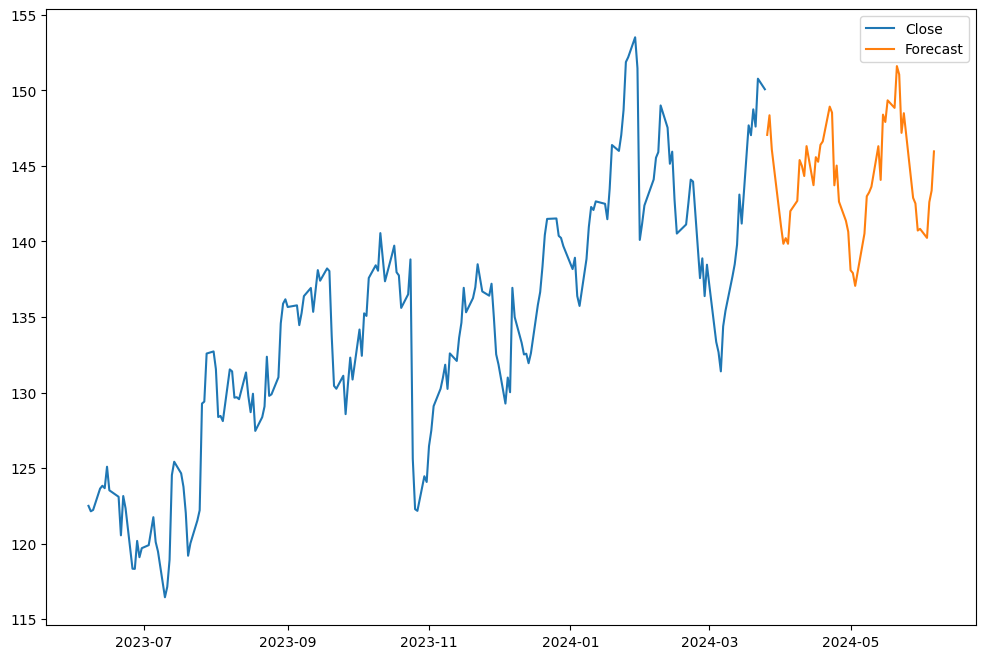

In [ ]:
df['forecast'] = model_fit.predict(start=split_index, end=df.index[-1])
#data[['Close','forecast']].plot(figsize=(12,8))
plt.figure(figsize=(12,8))
plt.plot(df.index[:split_index], df['Close'][:split_index], label='Close')

plt.plot(df.index[split_index:], df['forecast'][split_index:], label='Forecast')

plt.legend()
plt.show()

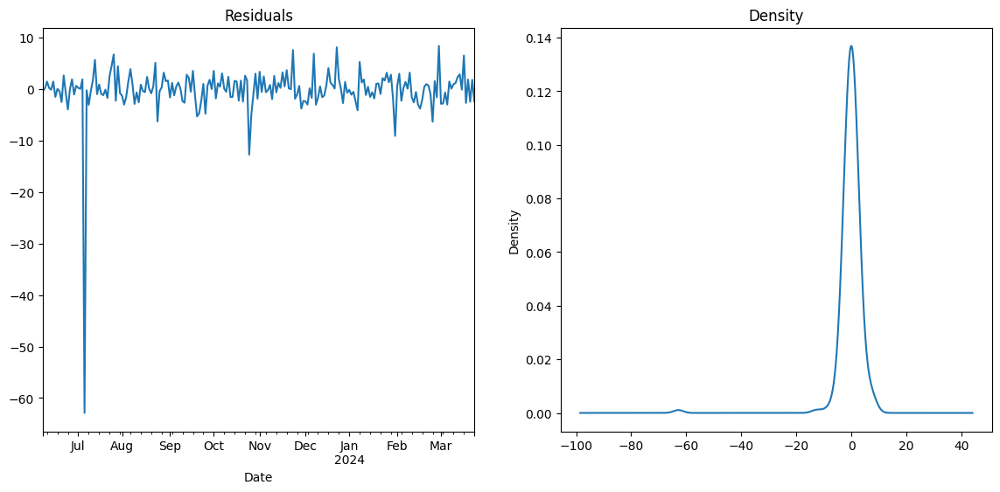

In [ ]:
residuals = model_fit.resid[1:]
residuals = residuals.fillna(method='ffill')
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.show()

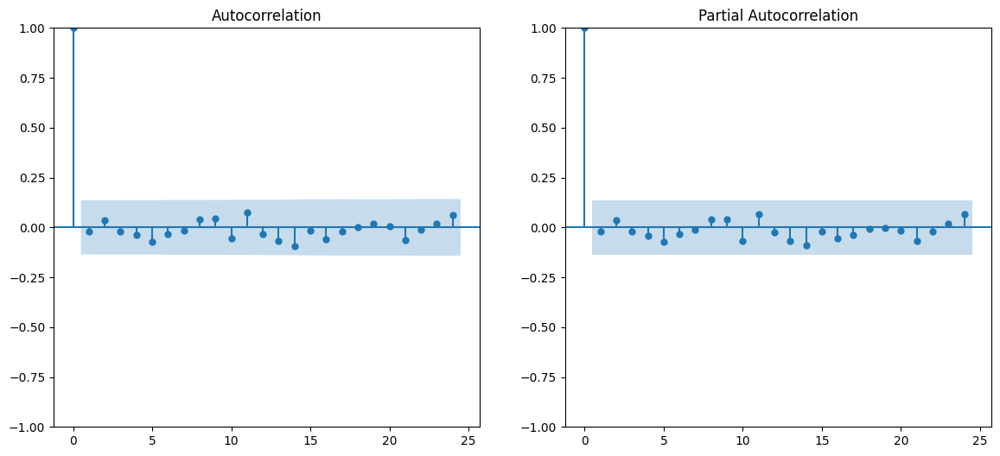

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

acf_res = plot_acf(residuals, ax=axes[0])

pacf_res = plot_pacf(residuals, ax=axes[1])

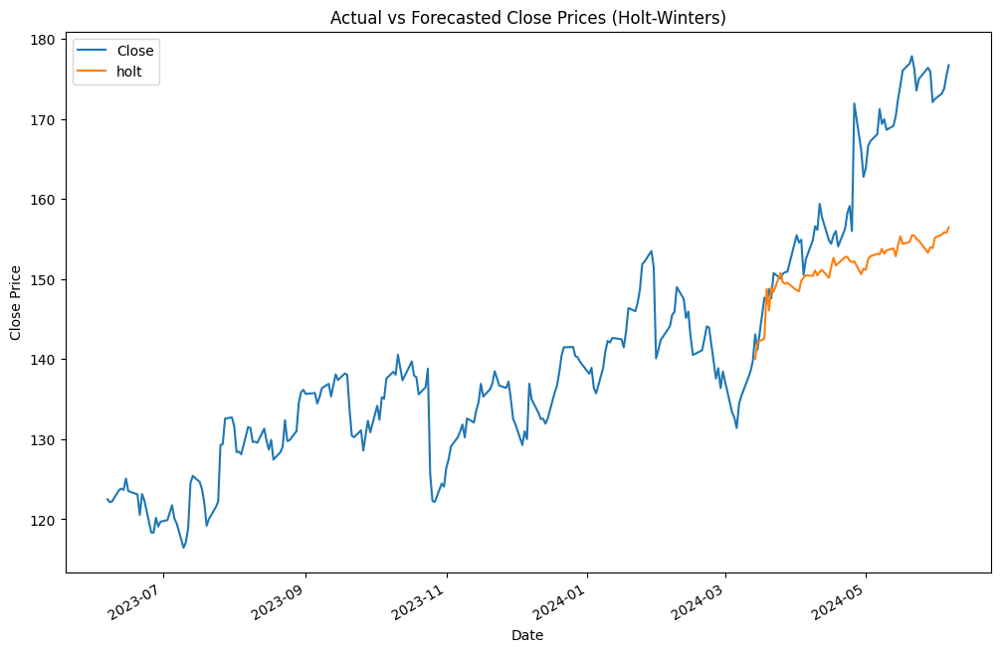

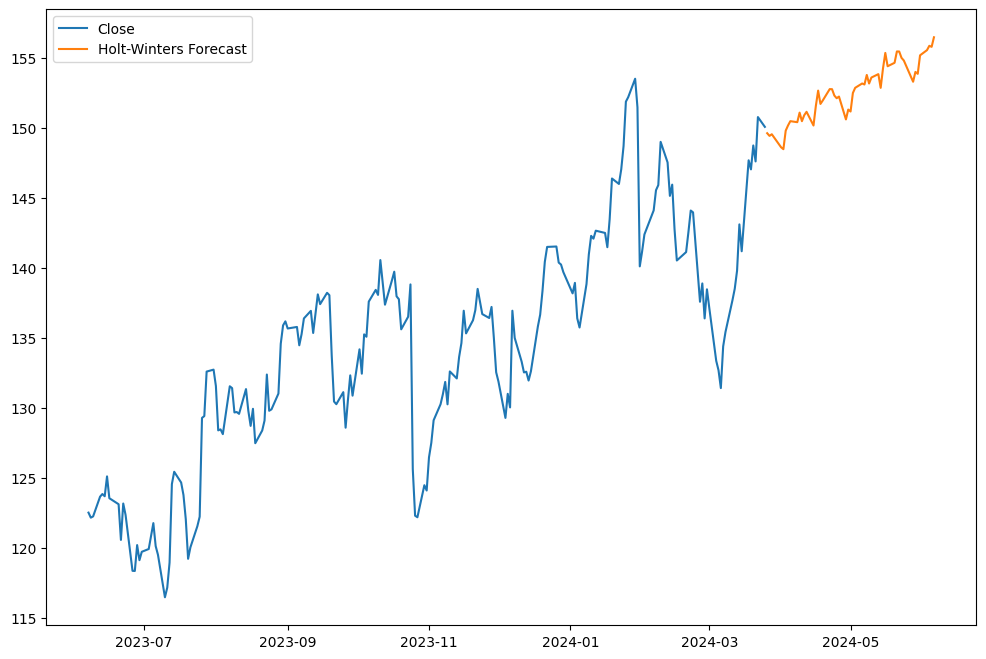

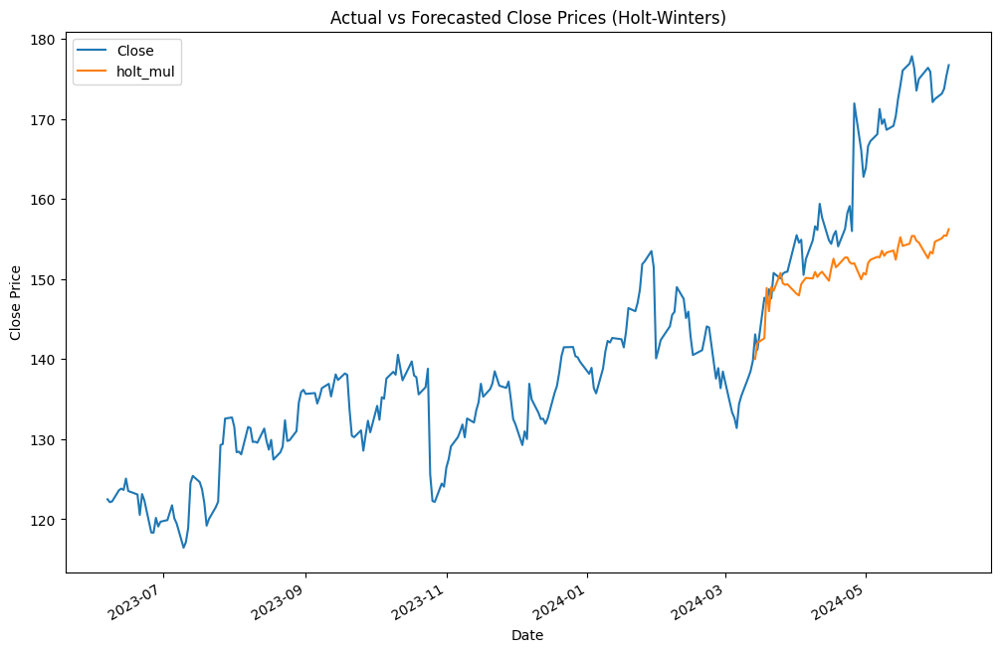

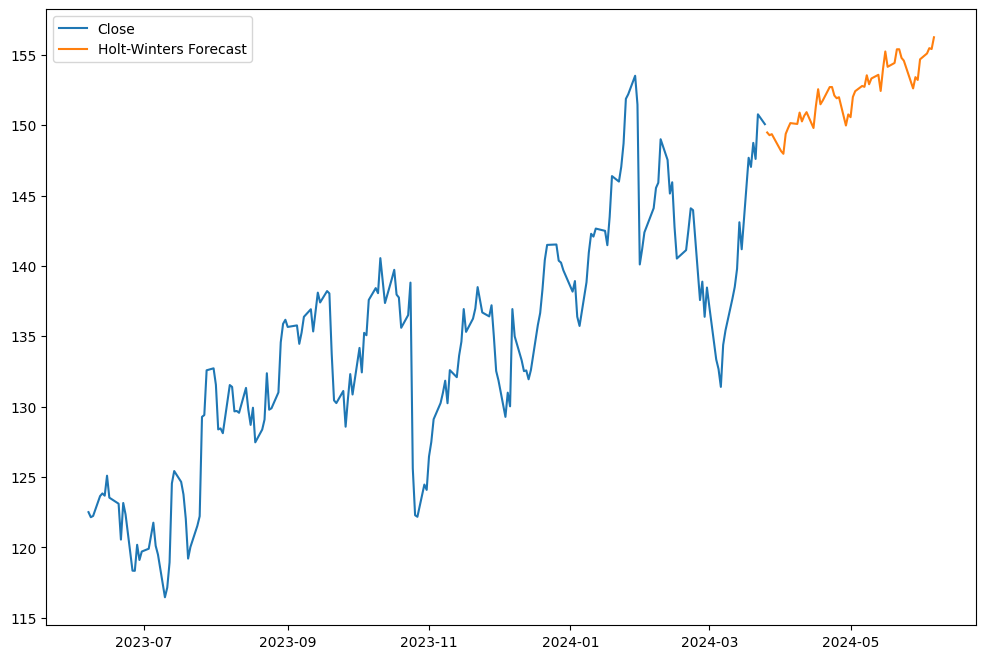

Original Data Range: 2023-06-07 00:00:00 to 2024-06-06 00:00:00
Forecast Data Range: 2024-03-14 00:00:00 to 2024-06-06 00:00:00


In [ ]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
holt_add = ExponentialSmoothing(endog=df_train,
                                trend='add',
                                seasonal='add',
                                seasonal_periods=21).fit()
# Predict for the required range
df['holt'] = holt_add.predict(start=split_index, end=df.index[-1])

# Plotting results
df[['Close', 'holt']].plot(figsize=(12, 8))
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Actual vs Forecasted Close Prices (Holt-Winters)')
plt.show()

plt.figure(figsize=(12, 8))
plt.plot(df.index[:split_index], df['Close'][:split_index], label='Close')
plt.plot(df.index[split_index:], df['holt'][split_index:], label='Holt-Winters Forecast')
plt.legend()
plt.show()

# Fit multiplicative Holt-Winters model
holt_mul = ExponentialSmoothing(endog=df_train,
                                trend='mul',
                                seasonal='mul',
                                seasonal_periods=21).fit()
# Predict for the required range
df['holt_mul'] = holt_mul.predict(start=split_index, end=df.index[-1])

# Plotting results
df[['Close', 'holt_mul']].plot(figsize=(12, 8))
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Actual vs Forecasted Close Prices (Holt-Winters)')
plt.show()

plt.figure(figsize=(12, 8))
plt.plot(df.index[:split_index], df['Close'][:split_index], label='Close')
plt.plot(df.index[split_index:], df['holt_mul'][split_index:], label='Holt-Winters Forecast')
plt.legend()
plt.show()

holt_forecast = holt_add.predict(start=split_index, end=df.index[-1])
df['holt'] = holt_forecast

print("Original Data Range:", df.index.min(), "to", df.index.max())
print("Forecast Data Range:", holt_forecast.index.min(), "to", holt_forecast.index.max())

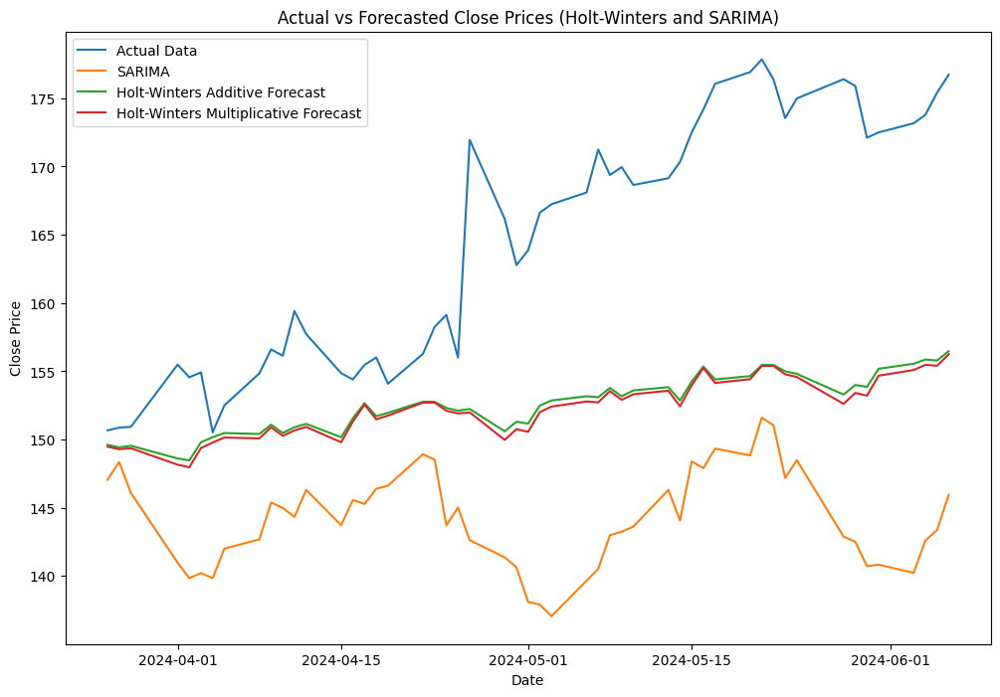

0
0
0
Additive Model - MAE: 12.00, MSE: 197.52, MAPE: 7.07%
Multiplicative Model - MAE: 12.31, MSE: 205.80, MAPE: 7.26%
SARIMA - MAE: 20.43, MSE: 504.99, MAPE: 12.15%


In [ ]:
plt.figure(figsize=(12, 8))

# Plot the actual data starting from the split index
plt.plot(df.index[split_index:len(df)], df['Close'][split_index:len(df)], label='Actual Data')

# Plot the SARIMA forecast starting from the split index
plt.plot(df.index[split_index:len(df)], df['forecast'][split_index:len(df)], label='SARIMA')

# Plot the Holt-Winters additive forecast starting from the split index
plt.plot(df.index[split_index:len(df)], df['holt'][split_index:len(df)], label='Holt-Winters Additive Forecast')

# Plot the Holt-Winters multiplicative forecast starting from the split index
plt.plot(df.index[split_index:len(df)], df['holt_mul'][split_index:len(df)], label='Holt-Winters Multiplicative Forecast')

plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Actual vs Forecasted Close Prices (Holt-Winters and SARIMA)')
plt.legend()
plt.show()


print(df['Close'][split_index:].isna().sum())
print(df['holt'][split_index:].isna().sum())
print(df['holt_mul'][split_index:].isna().sum())

mae_add = mean_absolute_error(df['Close'][split_index:], df['holt'][split_index:])
mse_add = mean_squared_error(df['Close'][split_index:], df['holt'][split_index:])
mape_add = np.mean(np.abs((df['Close'][split_index:] - df['holt'][split_index:]) / df['Close'][split_index:])) * 100

print(f"Additive Model - MAE: {mae_add:.2f}, MSE: {mse_add:.2f}, MAPE: {mape_add:.2f}%")

# Calculate MAE, MSE, and MAPE for the multiplicative model
mae_mul = mean_absolute_error(df['Close'][split_index:], df['holt_mul'][split_index:])
mse_mul = mean_squared_error(df['Close'][split_index:], df['holt_mul'][split_index:])
mape_mul = np.mean(np.abs((df['Close'][split_index:] - df['holt_mul'][split_index:]) / df['Close'][split_index:])) * 100

print(f"Multiplicative Model - MAE: {mae_mul:.2f}, MSE: {mse_mul:.2f}, MAPE: {mape_mul:.2f}%")

# Calculate MAE, MSE, and MAPE for the multiplicative model
mae_mul = mean_absolute_error(df['Close'][split_index:], df['forecast'][split_index:])
mse_mul = mean_squared_error(df['Close'][split_index:], df['forecast'][split_index:])
mape_mul = np.mean(np.abs((df['Close'][split_index:] - df['forecast'][split_index:]) / df['Close'][split_index:])) * 100

print(f"SARIMA - MAE: {mae_mul:.2f}, MSE: {mse_mul:.2f}, MAPE: {mape_mul:.2f}%")


In [ ]:
data = pd.read_csv('GOOGL.csv')
data = data[['Date', 'Close']]
data

,Date,Close
0,2023-06-07,122.500000
1,2023-06-08,122.139999
2,2023-06-09,122.230003
3,2023-06-12,123.639999
4,2023-06-13,123.830002
...,...,...
247,2024-05-31,172.500000
248,2024-06-03,173.169998
249,2024-06-04,173.789993
250,2024-06-05,175.410004


In [ ]:
from copy import deepcopy as dc

def prepare_dataframe_for_lstm(dataframe, n_steps):
    dataframe = dc(dataframe)

    dataframe.set_index('Date', inplace=True)

    for i in range(1, n_steps+1):
        dataframe[f'Close(t-{i})'] = dataframe['Close'].shift(i)

    dataframe.dropna(inplace=True)

    return dataframe

#def calculate_log_return(data, column_name='close'):
    #return np.log(data[column_name] / data[column_name].shift(1))

lookback = 5
shifted_df = prepare_dataframe_for_lstm(data, lookback)
shifted_df

,Close,Close(t-1),Close(t-2),Close(t-3),Close(t-4),Close(t-5)
Date,,,,,,
2023-06-14,123.669998,123.830002,123.639999,122.230003,122.139999,122.500000
2023-06-15,125.089996,123.669998,123.830002,123.639999,122.230003,122.139999
2023-06-16,123.529999,125.089996,123.669998,123.830002,123.639999,122.230003
2023-06-20,123.099998,123.529999,125.089996,123.669998,123.830002,123.639999
2023-06-21,120.550003,123.099998,123.529999,125.089996,123.669998,123.830002
...,...,...,...,...,...,...
2024-05-31,172.500000,172.110001,175.899994,176.399994,174.990005,173.550003
2024-06-03,173.169998,172.500000,172.110001,175.899994,176.399994,174.990005
2024-06-04,173.789993,173.169998,172.500000,172.110001,175.899994,176.399994


In [ ]:
shifted_df_as_np = shifted_df.to_numpy()

print(shifted_df_as_np.shape)

shifted_df_as_np

(247, 6)


array([[123.669998, 123.830002, 123.639999, 122.230003, 122.139999,
        122.5     ],
       [125.089996, 123.669998, 123.830002, 123.639999, 122.230003,
        122.139999],
       [123.529999, 125.089996, 123.669998, 123.830002, 123.639999,
        122.230003],
       ...,
       [173.789993, 173.169998, 172.5     , 172.110001, 175.899994,
        176.399994],
       [175.410004, 173.789993, 173.169998, 172.5     , 172.110001,
        175.899994],
       [176.729996, 175.410004, 173.789993, 173.169998, 172.5     ,
        172.110001]])

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(-1, 1))
shifted_df_as_np = scaler.fit_transform(shifted_df_as_np)

shifted_df_as_np

array([[-0.76482085, -0.75960899, -0.76579801, -0.81172622, -0.81465794,
        -0.80293153],
       [-0.71856685, -0.76482085, -0.75960899, -0.76579801, -0.81172622,
        -0.81465794],
       [-0.76938108, -0.71856685, -0.76482085, -0.75960899, -0.76579801,
        -0.81172622],
       ...,
       [ 0.86775204,  0.84755677,  0.82573273,  0.81302918,  0.9364817 ,
         0.95276835],
       [ 0.92052112,  0.86775204,  0.84755677,  0.82573273,  0.81302918,
         0.9364817 ],
       [ 0.96351759,  0.92052112,  0.86775204,  0.84755677,  0.82573273,
         0.81302918]])

In [ ]:
X = shifted_df_as_np[:, 1:]
y = shifted_df_as_np[:, 0]

X.shape, y.shape

((247, 5), (247,))

In [ ]:
X = dc(np.flip(X, axis=1))
X

array([[-0.80293153, -0.81465794, -0.81172622, -0.76579801, -0.75960899],
       [-0.81465794, -0.81172622, -0.76579801, -0.75960899, -0.76482085],
       [-0.81172622, -0.76579801, -0.75960899, -0.76482085, -0.71856685],
       ...,
       [ 0.95276835,  0.9364817 ,  0.81302918,  0.82573273,  0.84755677],
       [ 0.9364817 ,  0.81302918,  0.82573273,  0.84755677,  0.86775204],
       [ 0.81302918,  0.82573273,  0.84755677,  0.86775204,  0.92052112]])

In [ ]:
split_index = int(len(X) * 0.80)

split_index

197

In [ ]:
X_train = X[:split_index]
X_test = X[split_index:]

y_train = y[:split_index]
y_test = y[split_index:]

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((197, 5), (50, 5), (197,), (50,))

In [ ]:
X_train = X_train.reshape((-1, lookback, 1))
X_test = X_test.reshape((-1, lookback, 1))

y_train = y_train.reshape((-1, 1))
y_test = y_test.reshape((-1, 1))

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((197, 5, 1), (50, 5, 1), (197, 1), (50, 1))

In [ ]:
X_train = torch.tensor(X_train).float()
y_train = torch.tensor(y_train).float()
X_test = torch.tensor(X_test).float()
y_test = torch.tensor(y_test).float()

X_train.shape, X_test.shape, y_train.shape, y_test.shape

(torch.Size([197, 5, 1]),
 torch.Size([50, 5, 1]),
 torch.Size([197, 1]),
 torch.Size([50, 1]))

In [ ]:
from torch.utils.data import Dataset

class TimeSeriesDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, i):
        return self.X[i], self.y[i]

train_dataset = TimeSeriesDataset(X_train, y_train)
test_dataset = TimeSeriesDataset(X_test, y_test)

In [ ]:
from torch.utils.data import DataLoader

batch_size = 5

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
for _, batch in enumerate(train_loader):
    x_batch, y_batch = batch[0].to(device), batch[1].to(device)
    print(x_batch.shape, y_batch.shape)
    break

torch.Size([5, 5, 1]) torch.Size([5, 1])


In [ ]:
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_stacked_layers):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_stacked_layers = num_stacked_layers

        self.lstm = nn.LSTM(input_size, hidden_size, num_stacked_layers,
                            batch_first=True)

        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        c0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

model = LSTM(1, 4, 1)
model.to(device)
model

LSTM(
  (lstm): LSTM(1, 4, batch_first=True)
  (fc): Linear(in_features=4, out_features=1, bias=True)
)

In [ ]:
class GRU(nn.Module):
    def __init__(self, input_size, hidden_size, num_stacked_layers):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_stacked_layers = num_stacked_layers
        self.gru = nn.GRU(input_size, hidden_size, num_stacked_layers,
                          batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        out, _ = self.gru(x, h0)
        out = self.fc(out[:, -1, :])
        return out

model_GRU = GRU(1, 4, 1)
model_GRU.to(device)
model_GRU

GRU(
  (gru): GRU(1, 4, batch_first=True)
  (fc): Linear(in_features=4, out_features=1, bias=True)
)

In [ ]:
class RNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_stacked_layers):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_stacked_layers = num_stacked_layers
        self.rnn = nn.RNN(input_size, hidden_size, num_stacked_layers,
                          batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        out, _ = self.rnn(x, h0)
        out = self.fc(out[:, -1, :])
        return out

model_RNN = RNN(1, 4, 1)
model_RNN.to(device)
model_RNN

RNN(
  (rnn): RNN(1, 4, batch_first=True)
  (fc): Linear(in_features=4, out_features=1, bias=True)
)

In [ ]:
train_loss = {}

def train_one_epoch(modelType, optimizer):
    modelType.train(True)
    running_loss = 0.0
    for batch_index, batch in enumerate(train_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)

        output = modelType(x_batch)
        loss = loss_function(output, y_batch)
        running_loss += loss.item()

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch_index % 100 == 99:
            avg_loss_across_batches = running_loss / 100
            print('Batch {0}, Loss: {1:.3f}'.format(batch_index + 1, avg_loss_across_batches))
            running_loss = 0.0
    print()
    return running_loss / len(train_loader)

In [ ]:
val_loss = {}

def validate_one_epoch(modelType):
    modelType.train(False)
    running_loss = 0.0

    for batch_index, batch in enumerate(test_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)

        with torch.no_grad():
            output = modelType(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()

    avg_loss_across_batches = running_loss / len(test_loader)

    print('Val Loss: {0:.3f}'.format(avg_loss_across_batches))
    print('***************************************************')
    print()
    return avg_loss_across_batches


In [ ]:
def train_and_validate(modelType, optimizer, num_epochs):
    train_loss = {}
    val_loss = {}
    for epoch in range(num_epochs):
      print(f'Epoch: {epoch + 1}')
      train_loss[epoch] = train_one_epoch(modelType, optimizer)
      val_loss[epoch] = validate_one_epoch(modelType)
    return train_loss, val_loss

In [ ]:
from torch.utils.data import DataLoader

batch_size = 5

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

for _, batch in enumerate(train_loader):
    x_batch, y_batch = batch[0].to(device), batch[1].to(device)
    print(x_batch.shape, y_batch.shape)
    break
train_loss = {}
val_loss = {}

learning_rate = 0.001
epochs = 30
loss_function = nn.MSELoss()
optimizer_LSTM = torch.optim.Adam(model.parameters(), lr=learning_rate)
optimizer_GRU = torch.optim.Adam(model_GRU.parameters(), lr=learning_rate)
optimizer_RNN = torch.optim.Adam(model_RNN.parameters(), lr=learning_rate)

train_loss_lstm, val_loss_lstm = train_and_validate(model, optimizer_LSTM, epochs)
print('Model finished training')

train_loss_gru, val_loss_gru = train_and_validate(model_GRU, optimizer_GRU, epochs)
print('GRU finished training')

train_loss_rnn, val_loss_rnn = train_and_validate(model_RNN, optimizer_RNN, epochs)
print('RNN finished training')

torch.Size([5, 5, 1]) torch.Size([5, 1])
Epoch: 1

Val Loss: 0.504
***************************************************

Epoch: 2

Val Loss: 0.601
***************************************************

Epoch: 3

Val Loss: 0.706
***************************************************

Epoch: 4

Val Loss: 0.791
***************************************************

Epoch: 5

Val Loss: 0.815
***************************************************

Epoch: 6

Val Loss: 0.783
***************************************************

Epoch: 7

Val Loss: 0.726
***************************************************

Epoch: 8

Val Loss: 0.665
***************************************************

Epoch: 9

Val Loss: 0.604
***************************************************

Epoch: 10

Val Loss: 0.547
***************************************************

Epoch: 11

Val Loss: 0.496
***************************************************

Epoch: 12

Val Loss: 0.451
***************************************************

Epoch: 1

LSTM Training Loss (first 5): [0.22190748528810217, 0.16744136751367478, 0.12008013223821763, 0.08755448066367535, 0.06925600311515154]
LSTM Validation Loss (first 5): [0.601244093477726, 0.7061571389436722, 0.7905063018202781, 0.8151129871606827, 0.7826987594366074]
GRU Training Loss (first 5): [0.06319537460221909, 0.052136872729170135, 0.04659912199422252, 0.04253279932017904, 0.03875476234825328]
GRU Validation Loss (first 5): [0.5430365085601807, 0.5356025785207749, 0.4986474931240082, 0.4492719918489456, 0.3950875699520111]
RNN Training Loss (first 5): [0.24382282242004294, 0.1394350047048647, 0.09710139457165497, 0.08169330142409308, 0.07472048790223199]
RNN Validation Loss (first 5): [0.6596260532736778, 0.8366736054420472, 0.9163568526506424, 0.9236386746168137, 0.8989916414022445]


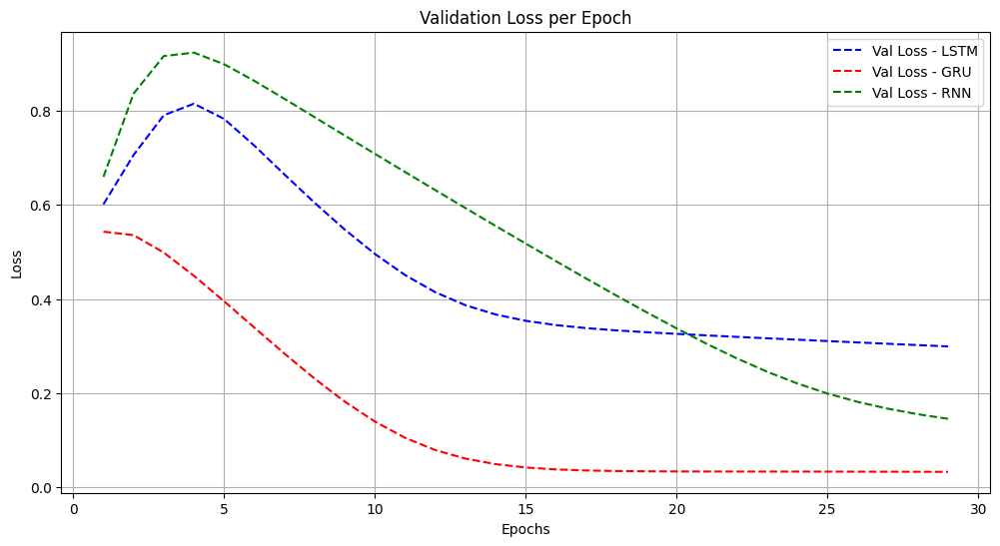

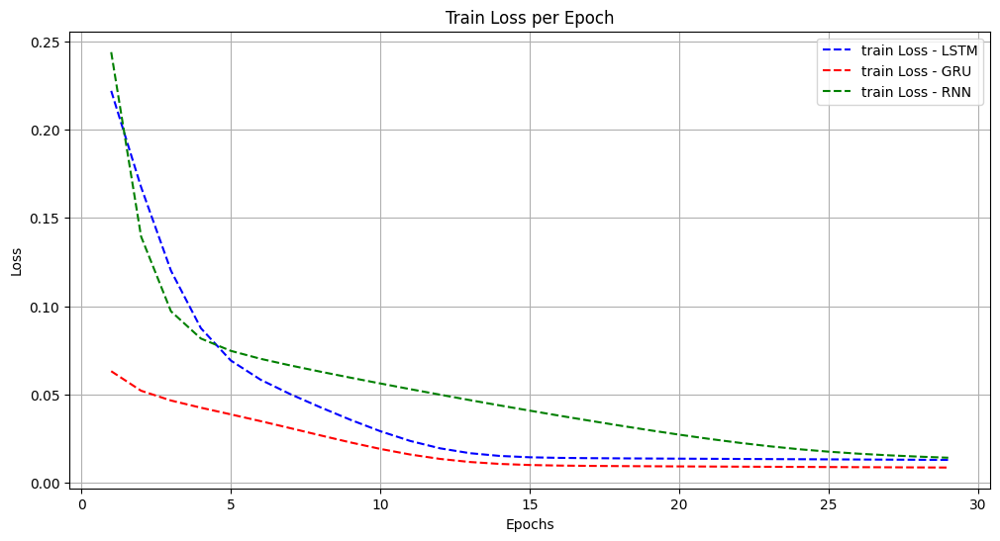

In [ ]:
epochs = 29

def dict_to_list(dict_data, epochs):
    return [dict_data[epoch] for epoch in range(1, epochs + 1)]

# Extract loss values from dictionaries
train_loss_lstm_list = dict_to_list(train_loss_lstm, epochs)
val_loss_lstm_list = dict_to_list(val_loss_lstm, epochs)
train_loss_gru_list = dict_to_list(train_loss_gru, epochs)
val_loss_gru_list = dict_to_list(val_loss_gru, epochs)
train_loss_rnn_list = dict_to_list(train_loss_rnn, epochs)
val_loss_rnn_list = dict_to_list(val_loss_rnn, epochs)

# Print first few elements to verify
print("LSTM Training Loss (first 5):", train_loss_lstm_list[:5])
print("LSTM Validation Loss (first 5):", val_loss_lstm_list[:5])
print("GRU Training Loss (first 5):", train_loss_gru_list[:5])
print("GRU Validation Loss (first 5):", val_loss_gru_list[:5])
print("RNN Training Loss (first 5):", train_loss_rnn_list[:5])
print("RNN Validation Loss (first 5):", val_loss_rnn_list[:5])

# Define epochs range
epochs_range = range(1, epochs + 1)

# Create plot
plt.figure(figsize=(12, 6))

# Plot for LSTM
plt.plot(epochs_range, val_loss_lstm_list, label='Val Loss - LSTM', color='blue', linestyle='--')

# Plot for GRU
plt.plot(epochs_range, val_loss_gru_list, label='Val Loss - GRU', color='red', linestyle='--')

# Plot for RNN
plt.plot(epochs_range, val_loss_rnn_list, label='Val Loss - RNN', color='green', linestyle='--')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

# Define epochs range
epochs_range = range(1, epochs + 1)

# Create plot
plt.figure(figsize=(12, 6))

# Plot for LSTM
plt.plot(epochs_range, train_loss_lstm_list, label='train Loss - LSTM', color='blue', linestyle='--')

# Plot for GRU
plt.plot(epochs_range, train_loss_gru_list, label='train Loss - GRU', color='red', linestyle='--')

# Plot for RNN
plt.plot(epochs_range, train_loss_rnn_list, label='train Loss - RNN', color='green', linestyle='--')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Train Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

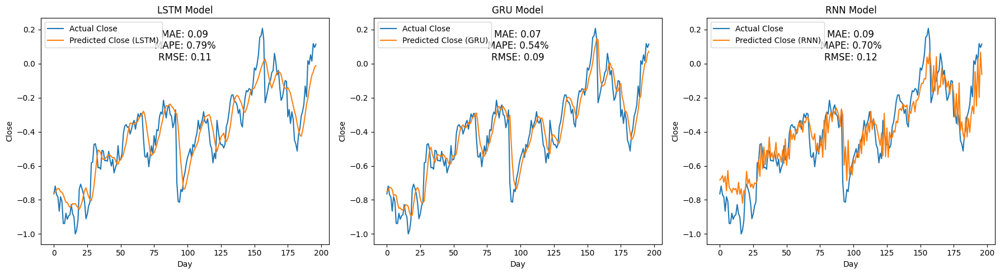

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error

with torch.no_grad():
    predicted = model(X_train.to(device)).to('cpu').numpy()
    predicted_GRU = model_GRU(X_train.to(device)).to('cpu').numpy()
    predicted_RNN = model_RNN(X_train.to(device)).to('cpu').numpy()


# Compute metrics for the baseline model
mae_baseline = mean_absolute_error(y_train, predicted)
mape_baseline = mean_absolute_percentage_error(y_train, predicted)   # Convert to percentage
rmse_baseline = np.sqrt(mean_squared_error(y_train, predicted))

# Compute metrics for the GRU model
mae_gru = mean_absolute_error(y_train, predicted_GRU)
mape_gru = mean_absolute_percentage_error(y_train, predicted_GRU) # Convert to percentage
rmse_gru = np.sqrt(mean_squared_error(y_train, predicted_GRU))

# Compute metrics for the RNN model
mae_rnn = mean_absolute_error(y_train, predicted_RNN)
mape_rnn = mean_absolute_percentage_error(y_train, predicted_RNN)  # Convert to percentage
rmse_rnn = np.sqrt(mean_squared_error(y_train, predicted_RNN))

# Create a figure with 1 row and 3 columns of subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# First subplot: Actual vs Predicted Close (Baseline)
axs[0].plot(y_train, label='Actual Close')
axs[0].plot(predicted, label='Predicted Close (LSTM)')
axs[0].set_xlabel('Day')
axs[0].set_ylabel('Close')
axs[0].legend()
axs[0].set_title('LSTM Model')
axs[0].text(0.5, 0.95, f'MAE: {mae_baseline:.2f}\nMAPE: {mape_baseline:.2f}%\nRMSE: {rmse_baseline:.2f}',
            horizontalalignment='center', verticalalignment='top',
            transform=axs[0].transAxes, fontsize=12)

# Second subplot: Actual vs Predicted Close using GRU
axs[1].plot(y_train, label='Actual Close')
axs[1].plot(predicted_GRU, label='Predicted Close (GRU)')
axs[1].set_xlabel('Day')
axs[1].set_ylabel('Close')
axs[1].legend()
axs[1].set_title('GRU Model')
axs[1].text(0.5, 0.95, f'MAE: {mae_gru:.2f}\nMAPE: {mape_gru:.2f}%\nRMSE: {rmse_gru:.2f}',
            horizontalalignment='center', verticalalignment='top',
            transform=axs[1].transAxes, fontsize=12)

# Third subplot: Actual vs Predicted Close using RNN
axs[2].plot(y_train, label='Actual Close')
axs[2].plot(predicted_RNN, label='Predicted Close (RNN)')
axs[2].set_xlabel('Day')
axs[2].set_ylabel('Close')
axs[2].legend()
axs[2].set_title('RNN Model')
axs[2].text(0.5, 0.95, f'MAE: {mae_rnn:.2f}\nMAPE: {mape_rnn:.2f}%\nRMSE: {rmse_rnn:.2f}',
            horizontalalignment='center', verticalalignment='top',
            transform=axs[2].transAxes, fontsize=12)

# Adjust layout to prevent overlap
plt.tight_layout()

# Display the plot
plt.show()

In [ ]:
test_predictions = model(X_test.to(device)).detach().cpu().numpy().flatten()

dummies = np.zeros((X_test.shape[0], lookback+1))
dummies[:, 0] = test_predictions
dummies = scaler.inverse_transform(dummies)

test_predictions = dc(dummies[:, 0])

test_predictions_GRU = model_GRU(X_test.to(device)).detach().cpu().numpy().flatten()

dummies = np.zeros((X_test.shape[0], lookback+1))
dummies[:, 0] = test_predictions_GRU
dummies = scaler.inverse_transform(dummies)

test_predictions_GRU = dc(dummies[:, 0])

test_predictions_RNN = model_RNN(X_test.to(device)).detach().cpu().numpy().flatten()

dummies = np.zeros((X_test.shape[0], lookback+1))
dummies[:, 0] = test_predictions_RNN
dummies = scaler.inverse_transform(dummies)

test_predictions_RNN = dc(dummies[:, 0])

print(test_predictions)
print(test_predictions_GRU)
print(test_predictions_RNN)

[147.12849821 147.32435575 147.56052563 147.91069093 148.30006654
 148.59184663 148.56715103 148.53008075 148.49734771 148.67110829
 148.83945087 149.25807626 149.54691187 149.55669569 149.39773917
 149.29943573 149.16891619 149.04064429 149.07722542 149.2604409
 149.46282785 149.53744508 149.78629316 150.35337224 150.60575333
 150.67323638 150.78292294 150.72658603 150.77241037 150.83495509
 151.002958   151.03997064 151.1000615  151.08671951 151.03673773
 151.00930396 151.01630776 151.04043039 151.09498912 151.13070393
 151.23021736 151.33973419 151.26519199 151.19480814 151.20416332
 151.32066382 151.28561875 151.22922512 151.18009376 151.1210912 ]
[149.82627475 150.1362613  150.3529015  152.26946693 152.99138809
 153.48305394 151.96101198 151.88001493 152.75207222 153.97613748
 154.44182431 156.03737735 156.20587112 155.09393666 154.25868248
 154.25850224 154.44867532 153.81144113 154.36710643 155.48618514
 156.41673537 155.65739443 161.35443915 162.15508466 161.19146699
 161.04827

In [ ]:
dummies = np.zeros((X_test.shape[0], lookback+1))
dummies[:, 0] = y_test.flatten()
dummies = scaler.inverse_transform(dummies)

new_y_test = dc(dummies[:, 0])
new_y_test

array([150.8699949 , 150.9299929 , 155.49000498, 154.55999823,
       154.91999813, 150.52999906, 152.49999991, 154.85000587,
       156.6000062 , 156.1399988 , 159.410004  , 157.72999592,
       154.86000058, 154.3999941 , 155.47000092, 156.00999528,
       154.08999612, 156.27999887, 158.25999466, 159.13000479,
       155.99999966, 171.94999747, 166.14999461, 162.77999839,
       163.86000175, 166.61999488, 167.24000549, 168.10000626,
       171.2499999 , 169.38000449, 169.96000697, 168.64999351,
       169.13999967, 170.33999629, 172.50999589, 174.17999279,
       176.05999755, 176.91999833, 177.850006  , 176.3800058 ,
       173.55000211, 174.99000537, 176.39999339, 175.89999434,
       172.11000068, 172.49999935, 173.16999815, 173.78999228,
       175.41000464, 176.72999635])

In [ ]:
squared_diff = (new_y_test - test_predictions) ** 2

root_squared_diff = np.sqrt(squared_diff)

accuracy_percentage = 100 - np.mean(root_squared_diff)

print(f"Accuracy Percentage: {accuracy_percentage:.2f}%")

Accuracy Percentage: 85.14%


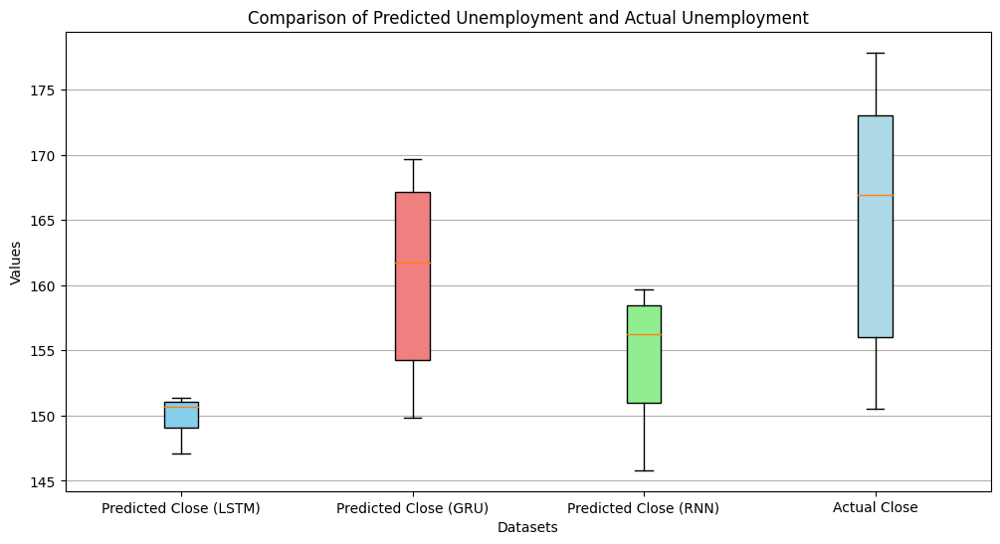

In [ ]:
plt.figure(figsize=(12, 6))

plt.boxplot(test_predictions, positions=[1], labels=['Predicted Close (LSTM)'], patch_artist=True, boxprops=dict(facecolor='skyblue'))
plt.boxplot(test_predictions_GRU, positions=[2], labels=['Predicted Close (GRU)'], patch_artist=True, boxprops=dict(facecolor='lightcoral'))
plt.boxplot(test_predictions_RNN, positions=[3], labels=['Predicted Close (RNN)'], patch_artist=True, boxprops=dict(facecolor='lightgreen'))
plt.boxplot(new_y_test, positions=[4], labels=['Actual Close'], patch_artist=True, boxprops=dict(facecolor='lightblue'))

plt.xlabel('Datasets')
plt.ylabel('Values')
plt.title('Comparison of Predicted Unemployment and Actual Unemployment')
plt.grid(axis='y')

plt.show()

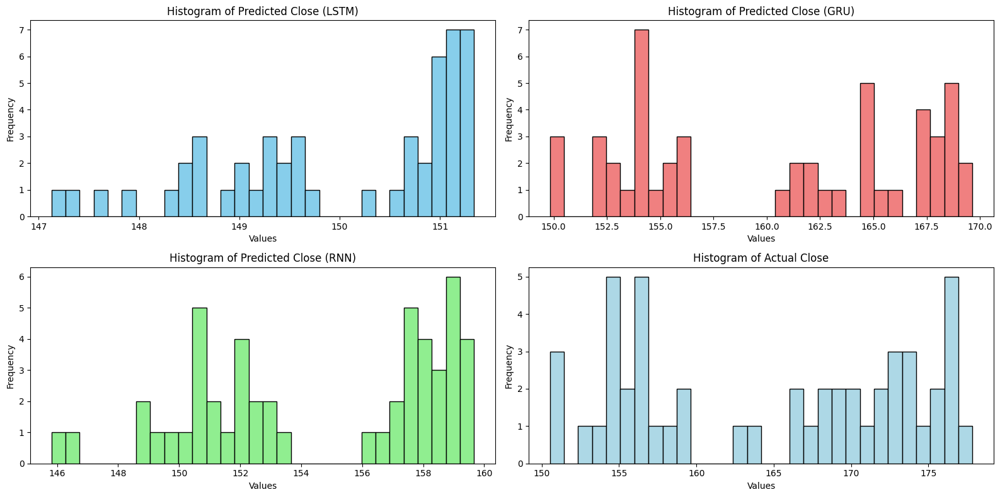

In [ ]:
plt.figure(figsize=(16, 8))

# Histogram for test_predictions
plt.subplot(2, 2, 1)
plt.hist(test_predictions, bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of Predicted Close (LSTM)')
plt.xlabel('Values')
plt.ylabel('Frequency')

# Histogram for test_predictions_GRU
plt.subplot(2, 2, 2)
plt.hist(test_predictions_GRU, bins=30, color='lightcoral', edgecolor='black')
plt.title('Histogram of Predicted Close (GRU)')
plt.xlabel('Values')
plt.ylabel('Frequency')

# Histogram for test_predictions_RNN
plt.subplot(2, 2, 3)
plt.hist(test_predictions_RNN, bins=30, color='lightgreen', edgecolor='black')
plt.title('Histogram of Predicted Close (RNN)')
plt.xlabel('Values')
plt.ylabel('Frequency')

# Histogram for new_y_test
plt.subplot(2, 2, 4)
plt.hist(new_y_test, bins=30, color='lightblue', edgecolor='black')
plt.title('Histogram of Actual Close')
plt.xlabel('Values')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

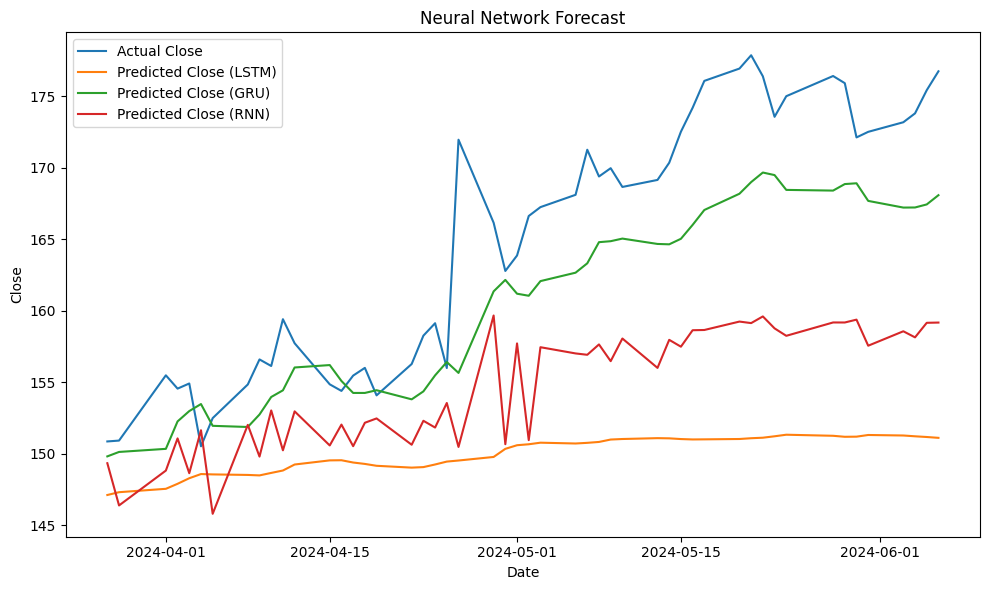

In [ ]:
# Minimum length of the series for consistent plotting
split_index = int(len(df) * 0.80)
df_train = df[:split_index]
df_test = df[split_index:]
min_length = min(len(df.index[split_index+1:]), len(new_y_test), len(test_predictions), len(test_predictions_GRU), len(test_predictions_RNN))

# Adjust the length of df.index to match the minimum length
index_series = df.index[split_index+1:][:min_length]

# Adjust the prediction series to match the minimum length
new_y_test_series = new_y_test[:min_length]
test_predictions_series = test_predictions[:min_length]
test_predictions_GRU_series = test_predictions_GRU[:min_length]
test_predictions_RNN_series = test_predictions_RNN[:min_length]

# Plotting
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.set_title('Neural Network Forecast')
ax1.plot(index_series, new_y_test_series, label='Actual Close')
ax1.plot(index_series, test_predictions_series, label='Predicted Close (LSTM)')
ax1.plot(index_series, test_predictions_GRU_series, label='Predicted Close (GRU)')
ax1.plot(index_series, test_predictions_RNN_series, label='Predicted Close (RNN)')
# Uncomment these lines if you have ARIMA forecasts available and they match in length
# ax1.plot(df.index[:min_length], df['forecast_manual'][:min_length], label='Manual Forecast (ARIMA)')
# ax1.plot(df.index[:min_length], df['forecast_auto'][:min_length], label='Auto Forecast (ARIMA)')

ax1.set_xlabel('Date')
ax1.set_ylabel('Close')
ax1.legend()

plt.tight_layout()
plt.show()


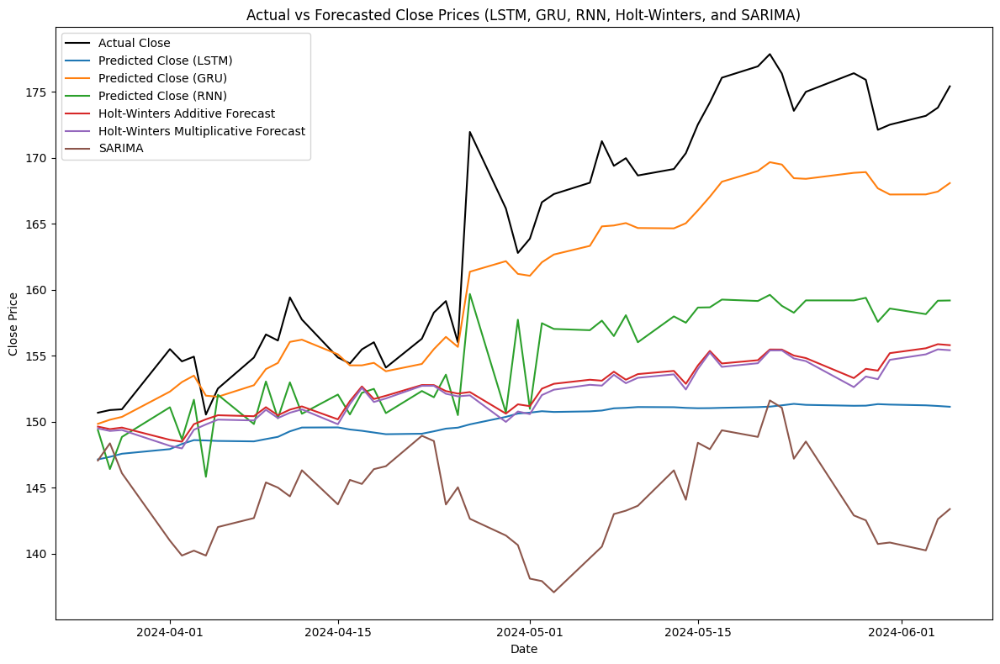

0
0
0
Additive Model - MAE: 12.00, MSE: 197.52, MAPE: 7.07%
Multiplicative Model - MAE: 12.31, MSE: 205.80, MAPE: 7.26%
SARIMA - MAE: 20.43, MSE: 504.99, MAPE: 12.15%
LSTM Model: MAE = 14.8582, MSE = 281.9411, MAPE = 8.78%
GRU Model: MAE = 4.5992, MSE = 30.6198, MAPE = 2.72%
RNN Model: MAE = 10.2376, MSE = 136.8736, MAPE = 6.05%


In [ ]:
# Minimum length of the series for consistent plotting
split_index = int(len(df) * 0.80)
min_length = min(len(df.index[split_index:]), len(new_y_test), len(test_predictions), len(test_predictions_GRU), len(test_predictions_RNN))

# Adjust the length of the series to match the minimum length
index_series = df.index[split_index:][:min_length]
new_y_test_series = new_y_test[:min_length]
test_predictions_series = test_predictions[:min_length]
test_predictions_GRU_series = test_predictions_GRU[:min_length]
test_predictions_RNN_series = test_predictions_RNN[:min_length]

# Create a combined plot
fig, ax = plt.subplots(figsize=(12, 8))

# Plot actual close prices
ax.plot(index_series, df['Close'][split_index:split_index+min_length], label='Actual Close', color='black')

# Plot LSTM, GRU, and RNN predictions starting from the split index
ax.plot(index_series, test_predictions_series, label='Predicted Close (LSTM)')
ax.plot(index_series, test_predictions_GRU_series, label='Predicted Close (GRU)')
ax.plot(index_series, test_predictions_RNN_series, label='Predicted Close (RNN)')

# Plot Holt-Winters and SARIMA forecasts starting from the split index
ax.plot(df.index[split_index:split_index+min_length], df['holt'][split_index:split_index+min_length], label='Holt-Winters Additive Forecast')
ax.plot(df.index[split_index:split_index+min_length], df['holt_mul'][split_index:split_index+min_length], label='Holt-Winters Multiplicative Forecast')
ax.plot(df.index[split_index:split_index+min_length], df['forecast'][split_index:split_index+min_length], label='SARIMA')

ax.set_xlabel('Date')
ax.set_ylabel('Close Price')
ax.set_title('Actual vs Forecasted Close Prices (LSTM, GRU, RNN, Holt-Winters, and SARIMA)')
ax.legend()

plt.tight_layout()
plt.show()

# Calculate and print the number of missing values
print(df['Close'][split_index:].isna().sum())
print(df['holt'][split_index:].isna().sum())
print(df['holt_mul'][split_index:].isna().sum())

# Calculate and print error metrics for the Holt-Winters Additive model
mae_add = mean_absolute_error(df['Close'][split_index:], df['holt'][split_index:])
mse_add = mean_squared_error(df['Close'][split_index:], df['holt'][split_index:])
mape_add = np.mean(np.abs((df['Close'][split_index:] - df['holt'][split_index:]) / df['Close'][split_index:])) * 100
print(f"Additive Model - MAE: {mae_add:.2f}, MSE: {mse_add:.2f}, MAPE: {mape_add:.2f}%")

# Calculate and print error metrics for the Holt-Winters Multiplicative model
mae_mul = mean_absolute_error(df['Close'][split_index:], df['holt_mul'][split_index:])
mse_mul = mean_squared_error(df['Close'][split_index:], df['holt_mul'][split_index:])
mape_mul = np.mean(np.abs((df['Close'][split_index:] - df['holt_mul'][split_index:]) / df['Close'][split_index:])) * 100
print(f"Multiplicative Model - MAE: {mae_mul:.2f}, MSE: {mse_mul:.2f}, MAPE: {mape_mul:.2f}%")

# Calculate and print error metrics for the SARIMA model
mae_sarima = mean_absolute_error(df['Close'][split_index:], df['forecast'][split_index:])
mse_sarima = mean_squared_error(df['Close'][split_index:], df['forecast'][split_index:])
mape_sarima = np.mean(np.abs((df['Close'][split_index:] - df['forecast'][split_index:]) / df['Close'][split_index:])) * 100
print(f"SARIMA - MAE: {mae_sarima:.2f}, MSE: {mse_sarima:.2f}, MAPE: {mape_sarima:.2f}%")

mae_lstm = mean_absolute_error(new_y_test_series, test_predictions_series)
mse_lstm = mean_squared_error(new_y_test_series, test_predictions_series)
mape_lstm = np.mean(np.abs((new_y_test_series - test_predictions_series) / new_y_test_series)) * 100

mae_gru = mean_absolute_error(new_y_test_series, test_predictions_GRU_series)
mse_gru = mean_squared_error(new_y_test_series, test_predictions_GRU_series)
mape_gru = np.mean(np.abs((new_y_test_series - test_predictions_GRU_series) / new_y_test_series)) * 100

mae_rnn = mean_absolute_error(new_y_test_series, test_predictions_RNN_series)
mse_rnn = mean_squared_error(new_y_test_series, test_predictions_RNN_series)
mape_rnn = np.mean(np.abs((new_y_test_series - test_predictions_RNN_series) / new_y_test_series)) * 100

print(f"LSTM Model: MAE = {mae_lstm:.4f}, MSE = {mse_lstm:.4f}, MAPE = {mape_lstm:.2f}%")
print(f"GRU Model: MAE = {mae_gru:.4f}, MSE = {mse_gru:.4f}, MAPE = {mape_gru:.2f}%")
print(f"RNN Model: MAE = {mae_rnn:.4f}, MSE = {mse_rnn:.4f}, MAPE = {mape_rnn:.2f}%")


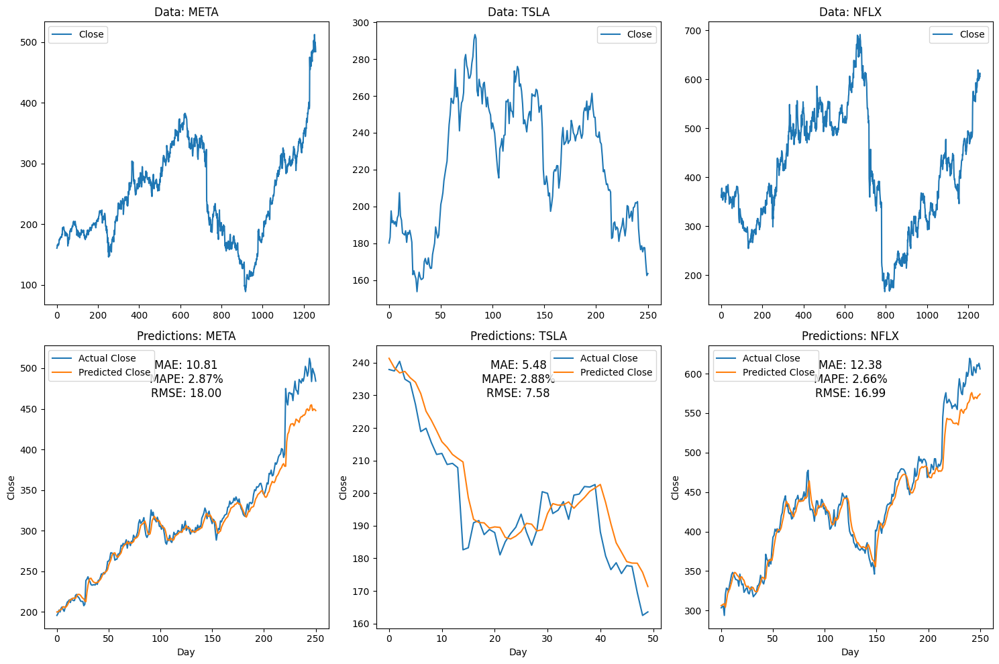

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import torch
from sklearn.preprocessing import MinMaxScaler

# Assuming prepare_dataframe_for_lstm, model, lookback, and device are defined elsewhere in your code
csv_files = ['META.csv', 'TSLA.csv', 'NFLX.csv']
#csv_files = ['META.csv', 'NFLX.csv']
data_plots = []
prediction_plots = []

fig, axs = plt.subplots(2, 3, figsize=(15, 10))

for i, csv_file in enumerate(csv_files):
    data = pd.read_csv(csv_file)
    data = data[['Date', 'Close']]

    ax_data = data.plot(ax=axs[0, i])
    data_plots.append(ax_data)
    ax_data.set_title(f'Data: {csv_file[:-4]}')

    shifted_df = prepare_dataframe_for_lstm(data, lookback)
    shifted_df_as_np = shifted_df.to_numpy()

    scaler = MinMaxScaler(feature_range=(-1, 1))
    shifted_df_as_np = scaler.fit_transform(shifted_df_as_np)

    X = shifted_df_as_np[:, 1:]
    y = shifted_df_as_np[:, 0]
    X = np.flip(X, axis=1)

    split_index = int(len(X) * 0.80)
    X_test = X[split_index:]
    y_test = y[split_index:]

    X_test = X_test.reshape((-1, lookback, 1))
    y_test = y_test.reshape((-1, 1))

    X_test = torch.tensor(X_test.copy()).float()
    y_test = torch.tensor(y_test.copy()).float()

    X_test = X_test.to(device)
    y_test = y_test.to(device)

    test_predictions = model_GRU(X_test.to(device)).detach().cpu().numpy().flatten()

    dummies = np.zeros((X_test.shape[0], lookback+1))
    dummies[:, 0] = test_predictions
    dummies = scaler.inverse_transform(dummies)
    test_predictions = dummies[:, 0]

    dummies = np.zeros((X_test.shape[0], lookback+1))
    dummies[:, 0] = y_test.cpu().numpy().flatten()
    dummies = scaler.inverse_transform(dummies)
    new_y_test = dummies[:, 0]

    # Calculate evaluation metrics
    mae = np.mean(np.abs(new_y_test - test_predictions))
    mape = np.mean(np.abs((new_y_test - test_predictions) / new_y_test)) * 100
    rmse = np.sqrt(np.mean((new_y_test - test_predictions) ** 2))

    # Plot the predictions with metrics
    ax_prediction = axs[1, i]
    ax_prediction.plot(new_y_test, label='Actual Close')
    ax_prediction.plot(test_predictions, label='Predicted Close')
    ax_prediction.set_xlabel('Day')
    ax_prediction.set_ylabel('Close')
    ax_prediction.legend()
    ax_prediction.text(0.5, 0.95, f'MAE: {mae:.2f}\nMAPE: {mape:.2f}%\nRMSE: {rmse:.2f}',
                       horizontalalignment='center', verticalalignment='top',
                       transform=ax_prediction.transAxes, fontsize=12)
    ax_prediction.set_title(f'Predictions: {csv_file[:-4]}')

plt.tight_layout()
plt.show()


**Analiza Volatilității prețului de închidere**

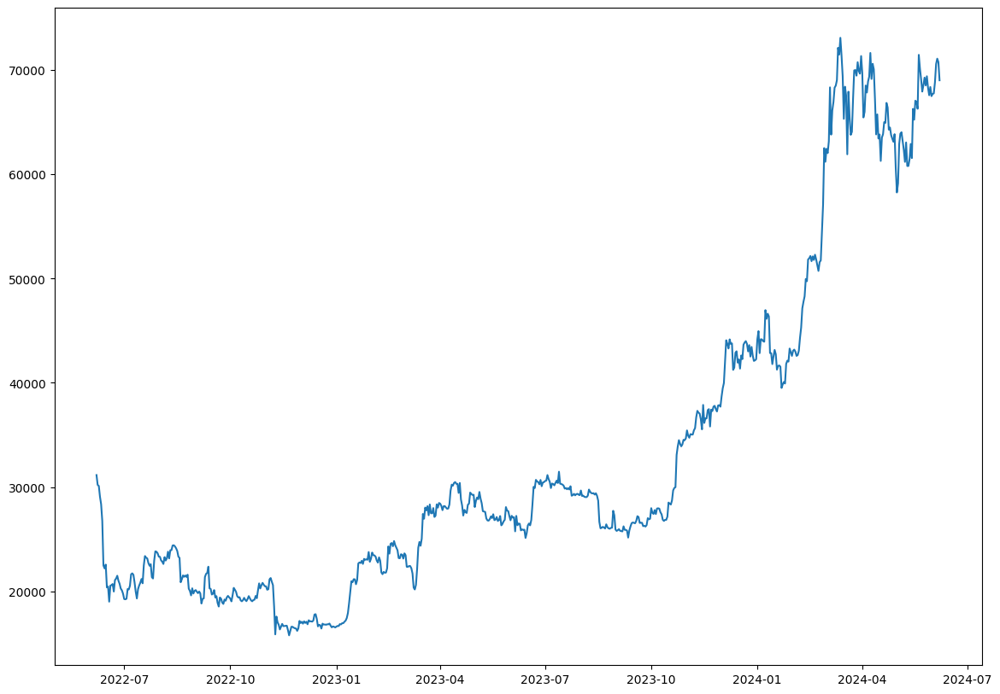

In [ ]:
data = pd.read_csv('BTC-USD.csv')
data = data[['Date', 'Close']]
data
data['Date'] = pd.to_datetime(data['Date'])

plt.figure(figsize=(14, 10))
plt.plot(data['Date'], data['Close'])

df = data

df["Date"] = pd.to_datetime(df["Date"])

df.set_index("Date", inplace=True)

p-value: 0.0


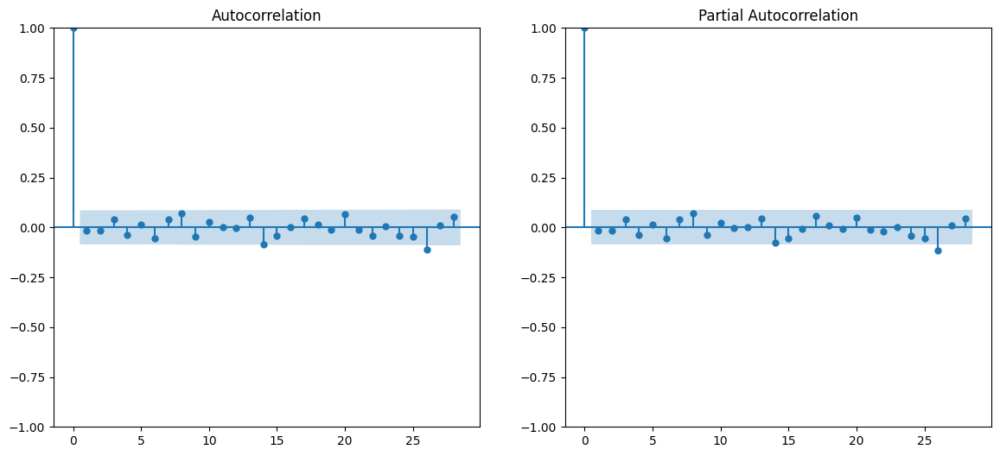

In [ ]:
returns = np.log(df).diff().dropna()
returns.index = pd.to_datetime(returns.index)
returns = returns.asfreq('B')

log_df= np.log(df)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

plot_acf(returns['Close'], ax=axes[0])

plot_pacf(returns['Close'], ax=axes[1])

adf_test = adfuller(returns['Close'])
print(f'p-value: {adf_test[1]}')

Number of missing values: 0


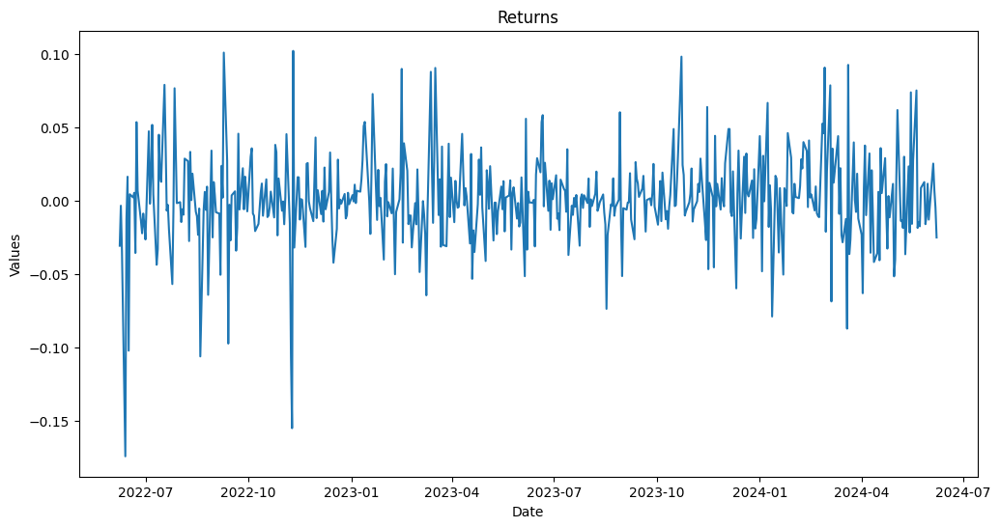

p-value of ADF test: 0.0
Ljung-Box test:
    lb_stat  lb_pvalue
10  8.48203   0.581861
Box-Pierce test:
Q-statistic: 746.8354735047011, p-value: 4.875386872693249e-153
Phillips-Perron test:
     Phillips-Perron Test (Z-tau)    
Test Statistic                -23.215
P-value                         0.000
Lags                               19
-------------------------------------

Trend: Constant
Critical Values: -3.44 (1%), -2.87 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.
(0.04397020476525808, 0.1, 3, {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})


<ipython-input-1627-1aac9c2bf513>:35: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  print(sm.tsa.stattools.kpss(returns, regression='ct'))


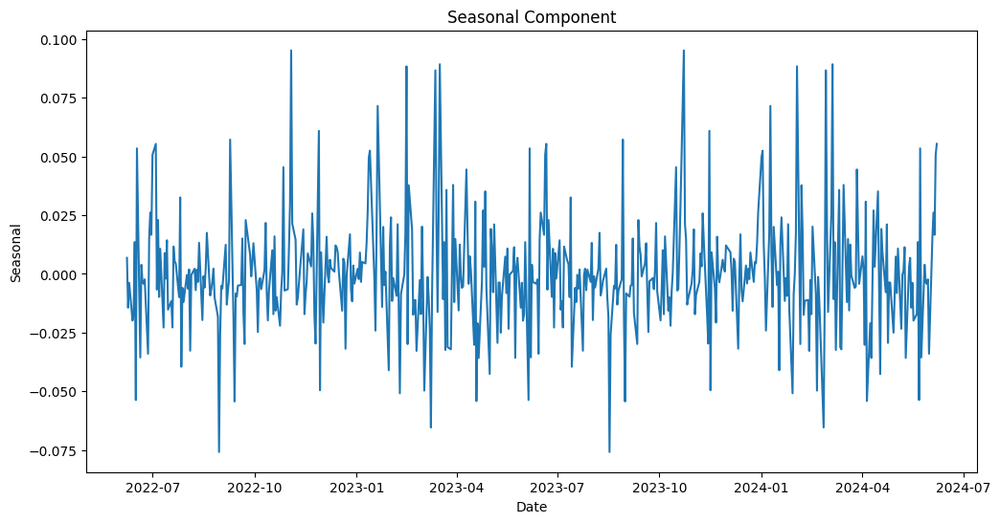

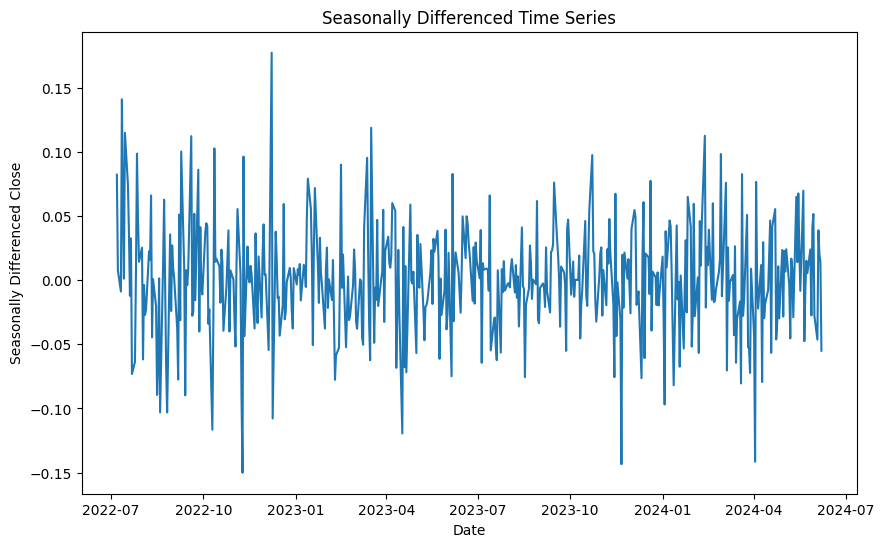

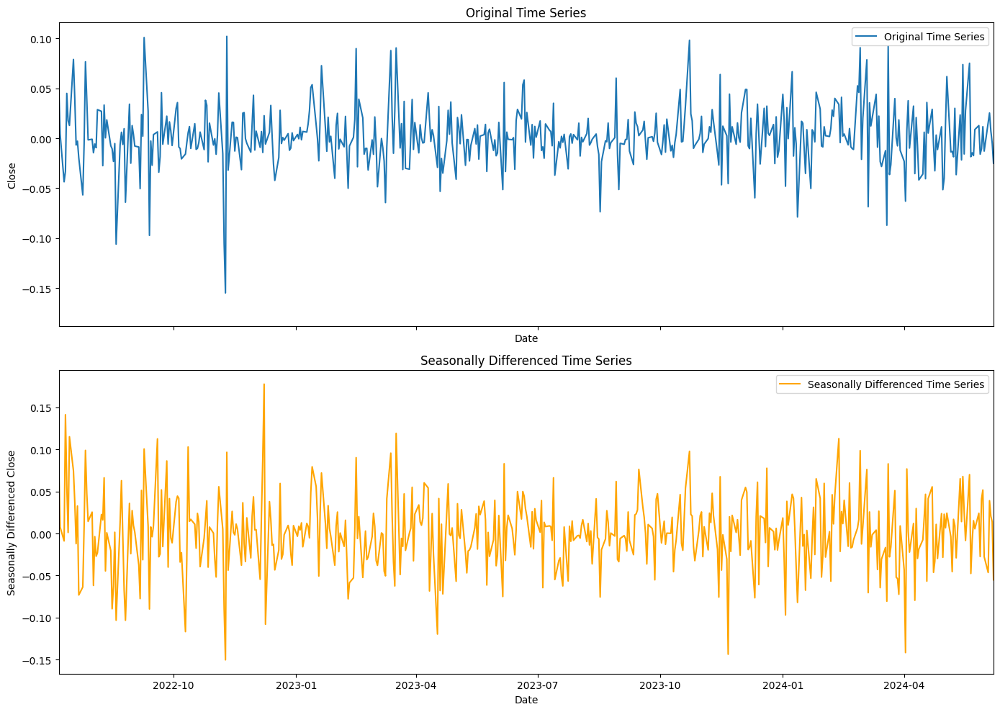

p-value of ADF test: 0.0
Ljung-Box test:
    lb_stat  lb_pvalue
10  8.48203   0.581861
Box-Pierce test:
Q-statistic: 746.8354735047011, p-value: 4.875386872693249e-153
Phillips-Perron test:
     Phillips-Perron Test (Z-tau)    
Test Statistic                -23.215
P-value                         0.000
Lags                               19
-------------------------------------

Trend: Constant
Critical Values: -3.44 (1%), -2.87 (5%), -2.57 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.
(0.04397020476525808, 0.1, 3, {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})


<ipython-input-1627-1aac9c2bf513>:105: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  print(sm.tsa.stattools.kpss(seasonal_diff, regression='ct'))


In [ ]:
missing_values = returns['Close'].isnull().sum()
print(f"Number of missing values: {missing_values}")

# Step 2: Handle missing values (you can choose one of the methods below)

# Option 1: Drop missing values
returns = returns['Close'].dropna()

plt.figure(figsize=(12, 6))
plt.plot(returns)
plt.title('Returns')
plt.xlabel('Date')
plt.ylabel('Values')
plt.show()

adf_test = adfuller(returns)
print(f'p-value of ADF test: {adf_test[1]}')

# Ljung-Box test
ljung_box_test = acorr_ljungbox(returns, lags=[10], return_df=True)
print('Ljung-Box test:')
print(ljung_box_test)

# Box-Pierce test
box_pierce_test = q_stat(acf(returns, nlags=10), len(log_df))
print('Box-Pierce test:')
print(f'Q-statistic: {box_pierce_test[0][-1]}, p-value: {box_pierce_test[1][-1]}')

# Phillips-Perron test
pp_test = PhillipsPerron(returns)
print('Phillips-Perron test:')
print(pp_test)
#kpss = KPSS()
#print(kpss.summary().as_text())
print(sm.tsa.stattools.kpss(returns, regression='ct'))

# Option 2: Fill missing values (uncomment one)
# returns = returns['Close'].fillna(method='ffill')  # forward fill
# returns = returns['Close'].fillna(method='bfill')  # backward fill

# Step 3: Perform seasonal decomposition
result = seasonal_decompose(returns, model='additive', period=252)

# Step 4: Extract and plot the seasonal component
seasonal = result.seasonal
plt.figure(figsize=(12, 6))
plt.plot(seasonal)
plt.title('Seasonal Component')
plt.xlabel('Date')
plt.ylabel('Seasonal')
plt.show()

# Step 5: Differencing to remove seasonality
seasonal_diff = returns.diff(21).dropna()
plt.figure(figsize=(10, 6))
plt.plot(seasonal_diff)
plt.title('Seasonally Differenced Time Series')
plt.xlabel('Date')
plt.ylabel('Seasonally Differenced Close')
plt.show()

fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# Plot the original time series, adjusting to the date range of the seasonally adjusted series
axes[0].plot(returns, label='Original Time Series')
axes[0].set_xlim(seasonal_diff.index.min(), seasonal_diff.index.max())
axes[0].set_title('Original Time Series')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Close')
axes[0].legend()

# Plot the seasonally differenced time series
axes[1].plot(seasonal_diff, label='Seasonally Differenced Time Series', color='orange')
axes[1].set_title('Seasonally Differenced Time Series')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Seasonally Differenced Close')
axes[1].legend()
# Adjust layout
plt.tight_layout()
plt.show()

seasonal_diff = returns.copy()

seasonal_diff = returns.asfreq('B')

adf_test = adfuller(seasonal_diff)
print(f'p-value of ADF test: {adf_test[1]}')

# Ljung-Box test
ljung_box_test = acorr_ljungbox(seasonal_diff, lags=[10], return_df=True)
print('Ljung-Box test:')
print(ljung_box_test)

# Box-Pierce test
box_pierce_test = q_stat(acf(seasonal_diff, nlags=10), len(log_df))
print('Box-Pierce test:')
print(f'Q-statistic: {box_pierce_test[0][-1]}, p-value: {box_pierce_test[1][-1]}')

# Phillips-Perron test
pp_test = PhillipsPerron(seasonal_diff)
print('Phillips-Perron test:')
print(pp_test)
#kpss = KPSS()
#print(kpss.summary().as_text())
print(sm.tsa.stattools.kpss(seasonal_diff, regression='ct'))

In [ ]:
model_estimare = ARIMA(seasonal_diff, order=(1, 0, 1))

model_estimare = model_estimare.fit()

print(model_estimare.summary())

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                  523
Model:                 ARIMA(1, 0, 1)   Log Likelihood                1080.616
Date:                Sat, 22 Jun 2024   AIC                          -2153.232
Time:                        18:29:57   BIC                          -2136.194
Sample:                    06-08-2022   HQIC                         -2146.559
                         - 06-07-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0013      0.001      0.908      0.364      -0.001       0.004
ar.L1         -0.5514      2.062     -0.267      0.789      -4.593       3.490
ma.L1          0.5620      2.054      0.274      0.7

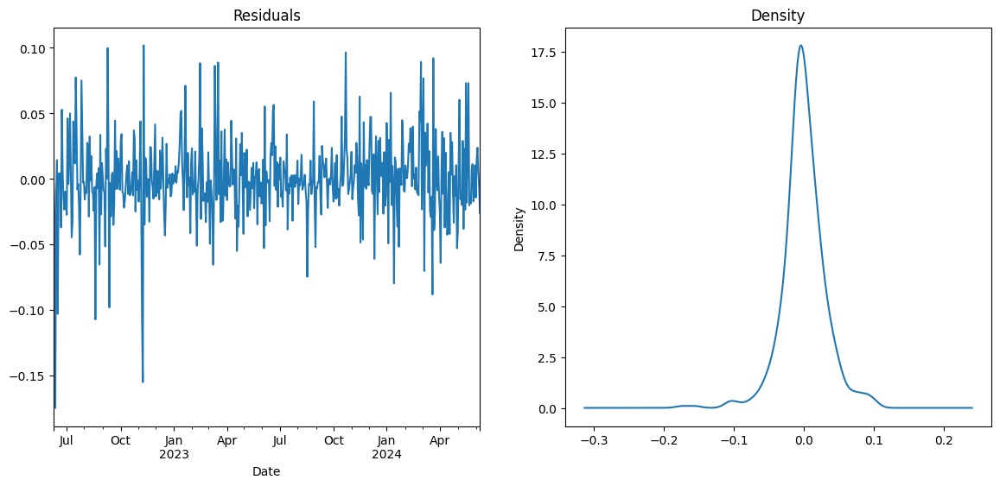

In [ ]:
residuals = model_estimare.resid[1:]
residuals = residuals.fillna(method='ffill')
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
residuals.plot(title='Residuals', ax=ax[0])
residuals.plot(title='Density', kind='kde', ax=ax[1])
plt.show()

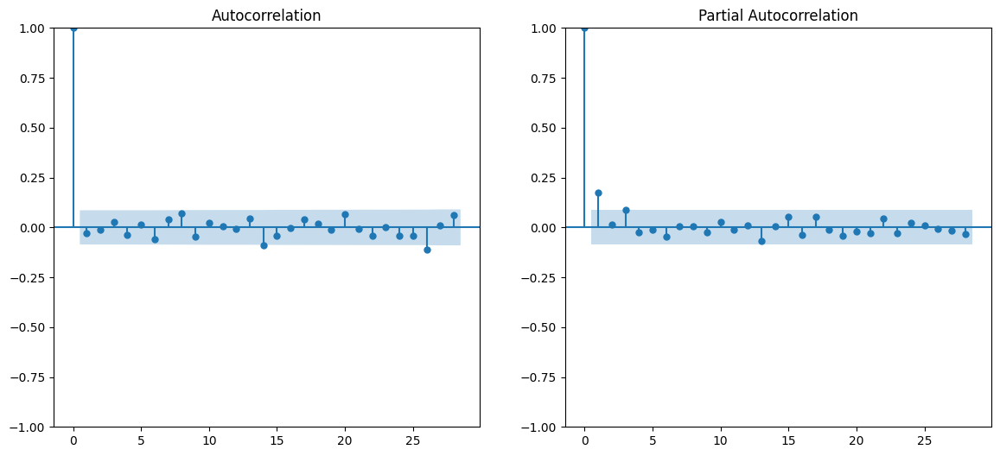

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

acf_res = plot_acf(residuals, ax=axes[0])

pacf_res = plot_pacf(residuals**2, ax=axes[1])

In [ ]:
statsmodels.stats.diagnostic.het_arch(residuals, nlags=None, store=False, ddof=0)
#EFECTE ARCH PREZENTE

(41.60390426138241,
 8.818466185190366e-06,
 4.431064845940945,
 5.409727573147838e-06)

In [ ]:
statsmodels.stats.diagnostic.het_arch(residuals, nlags=2, store=False, ddof=0) #Testare efecte arch pe primele 2 laguri
#Exista efecte arch in primele 2 laguri

(15.614967015960302,
 0.0004066801686002754,
 8.002753273119943,
 0.00037771308085714873)

Number of NaN values: 0
Number of infinite values: 0
Number of NaN values after cleaning: 0
Number of infinite values after cleaning: 0
Iteration:      1,   Func. Count:      6,   Neg. LLF: 57008174.21532777
Iteration:      2,   Func. Count:     17,   Neg. LLF: -933.9980473799304
Iteration:      3,   Func. Count:     24,   Neg. LLF: -888.2567306567951
Iteration:      4,   Func. Count:     33,   Neg. LLF: 2435638383.909526
Iteration:      5,   Func. Count:     44,   Neg. LLF: -180.2469736609839
Iteration:      6,   Func. Count:     52,   Neg. LLF: -1098.563361196797
Iteration:      7,   Func. Count:     58,   Neg. LLF: -1073.3211388039006
Iteration:      8,   Func. Count:     66,   Neg. LLF: -1051.6826192547412
Iteration:      9,   Func. Count:     73,   Neg. LLF: -1036.859819614208
Iteration:     10,   Func. Count:     79,   Neg. LLF: -1101.079033119502
Iteration:     11,   Func. Count:     84,   Neg. LLF: -1101.0794549914185
Iteration:     12,   Func. Count:     89,   Neg. LLF: -1101.

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:311: DataScaleWarning: y is poorly scaled, which may affect convergence of the optimizer when
estimating the model parameters. The scale of y is 0.0009396. Parameter
estimation work better when this value is between 1 and 1000. The recommended
rescaling is 100 * y.

This warning can be disabled by either rescaling y before initializing the
model or by setting rescale=False.

  warnings.warn(


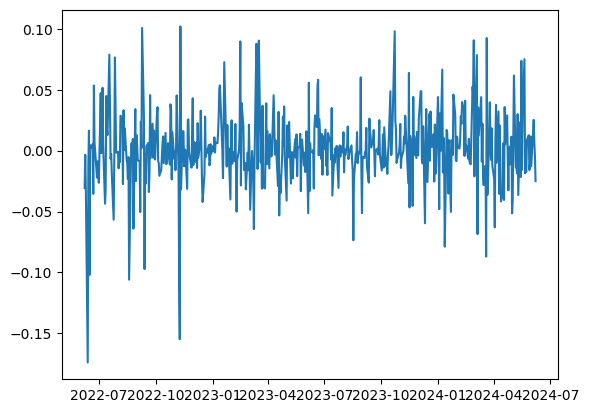

In [ ]:
from arch import arch_model
# Check for NaN and infinite values
nan_count = seasonal_diff.isna().sum()
inf_count = np.isinf(seasonal_diff).sum()
print(f"Number of NaN values: {nan_count}")
print(f"Number of infinite values: {inf_count}")

# Drop NaN values
returns_clean = returns.dropna()


nan_check = returns_clean.isna().sum()
inf_check = np.isinf(returns_clean).sum()
print(f"Number of NaN values after cleaning: {nan_check}")
print(f"Number of infinite values after cleaning: {inf_check}")

# Fit the model
if isinstance(returns_clean, pd.DataFrame):
    returns_clean = returns_clean.squeeze()

# Rescale the data by multiplying by 100
# Fit the ARCH model with rescaled data
model_arch = arch_model(returns_clean, p=1, q=1)
model_arch = model_arch.fit()
print(model_arch.summary())

plt.plot(returns_clean)
residuals_garch = model_arch.resid[1:]
statsmodels.stats.diagnostic.het_arch(residuals_garch, nlags=None, store=False, ddof=0)

returns_rescaled = returns_clean * 100

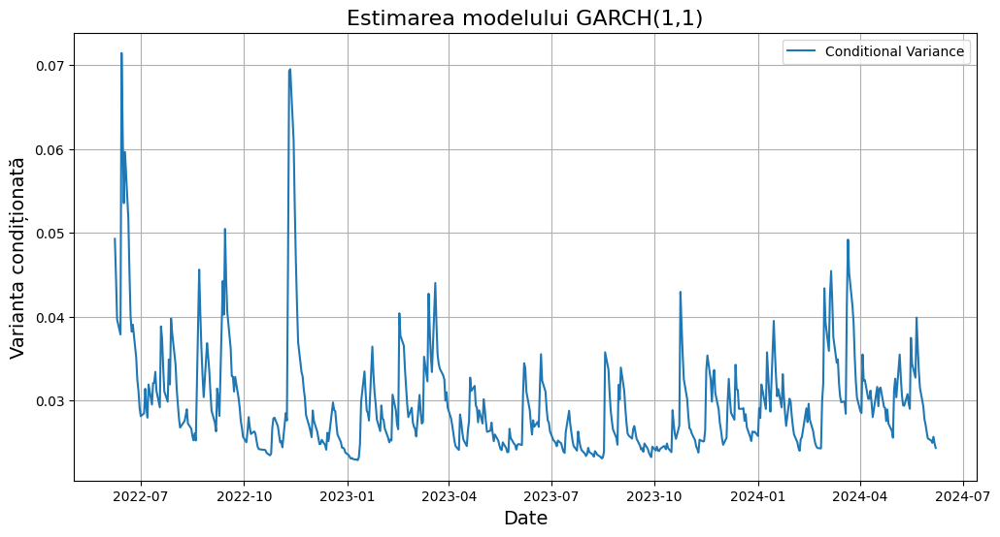

ARCH test results:


Date
2022-06-08    0.049274
2022-06-09    0.044777
2022-06-10    0.039671
2022-06-13    0.037879
2022-06-14    0.071437
                ...   
2024-06-03    0.025221
2024-06-04    0.024952
2024-06-05    0.025683
2024-06-06    0.024892
2024-06-07    0.024347
Freq: B, Name: cond_vol, Length: 523, dtype: float64

In [ ]:
conditional_variance = model_arch.conditional_volatility

# Create the plot
plt.figure(figsize=(12, 6))
#sns.set(style="whitegrid")
plt.plot(returns_rescaled.index, conditional_variance, label='Conditional Variance')
plt.title('Estimarea modelului GARCH(1,1)', fontsize=16)
plt.ylabel('Varianta condiționată', fontsize=14)
plt.xlabel('Date', fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

# Check for ARCH effects in residuals
residuals_garch = model_arch.resid[1:]
print("ARCH test results:")
#print(f"F-statistic: {arch_test[0]}, p-value: {arch_test[1]}")
conditional_variance

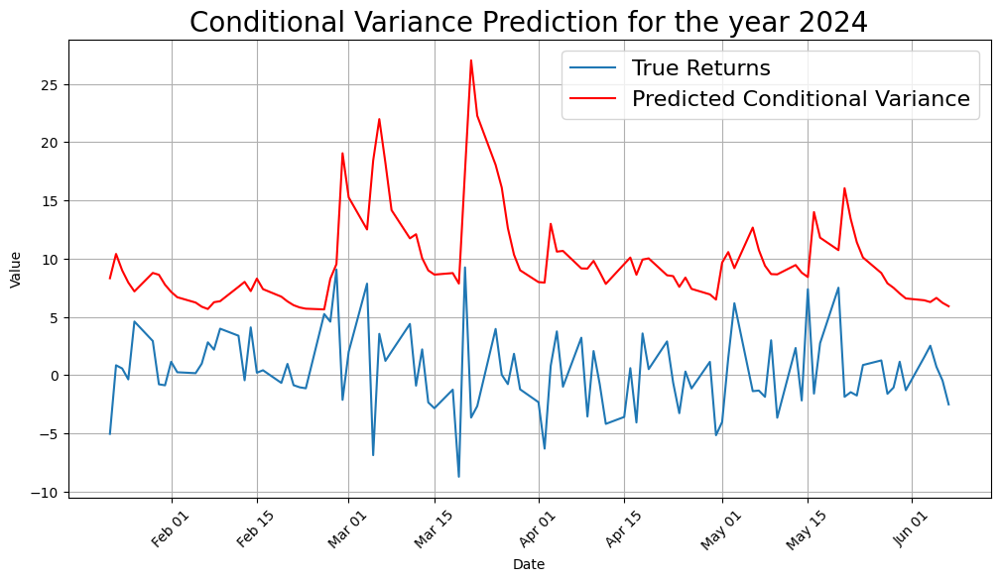

In [ ]:
import matplotlib.dates as mdates
rolling_predictions = []
test_size = 100

for i in range(test_size):
    train = returns_rescaled[:-(test_size - i)]
    model = arch_model(train, p=1, q=1)
    model_fit = model.fit(disp='off')
    pred = model_fit.forecast(horizon=1)
    rolling_predictions.append(pred.variance.values[-1, 0])

# Convert rolling_predictions to a pandas Series
rolling_predictions = pd.Series(rolling_predictions, index=returns_rescaled.index[-test_size:])

# Plot the results
plt.figure(figsize=(12, 6))
true_line, = plt.plot(returns_rescaled[-test_size:], label='True Returns')
pred_line, = plt.plot(rolling_predictions, label='Predicted Conditional Variance', color='red')
plt.title('Conditional Variance Prediction for the year 2024', fontsize=20)
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend(['True Returns', 'Predicted Conditional Variance'], fontsize=16)
plt.grid(True)

# Set the formatter for the x-axis to show month and day
ax = plt.gca()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))

# Optionally, you can rotate the labels if needed
plt.xticks(rotation=45)

plt.show()

In [ ]:
data = pd.read_csv('GOOGL(10 ani).csv')
data = data[['Date', 'Close']]
data
print(returns)

Date
2022-06-08   -0.030673
2022-06-09   -0.003393
2022-06-10   -0.034742
2022-06-13   -0.174053
2022-06-14   -0.012556
                ...   
2024-06-03    0.015425
2024-06-04    0.025300
2024-06-05    0.007272
2024-06-06   -0.004592
2024-06-07   -0.025039
Freq: B, Name: Close, Length: 523, dtype: float64


In [ ]:
df = data
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' column as the index
df.set_index('Date', inplace=True)
# Display the DataFrame to verify
df['Conditional_Variance'] = conditional_variance
print(df)
null_count = df['Conditional_Variance'].isnull().sum()

print(f"Number of rows with null 'Conditional_Variance': {null_count}")

df = df.dropna(subset=['Conditional_Variance'])

# Display the cleaned DataFrame
print("\nDataFrame after removing rows with NaN:")
print(df)

                 Close  Conditional_Variance
Date                                        
2014-05-30   28.582500                   NaN
2014-06-02   28.216999                   NaN
2014-06-03   27.725500                   NaN
2014-06-04   27.688000                   NaN
2014-06-05   28.246500                   NaN
...                ...                   ...
2024-05-28  176.399994              0.027787
2024-05-29  175.899994              0.027130
2024-05-30  172.110001              0.026262
2024-05-31  172.500000              0.025481
2024-06-03  173.169998              0.025221

[2520 rows x 2 columns]
Number of rows with null 'Conditional_Variance': 2021

DataFrame after removing rows with NaN:
                 Close  Conditional_Variance
Date                                        
2022-06-08  117.194000              0.049274
2022-06-09  114.835503              0.044777
2022-06-10  111.161499              0.039671
2022-06-13  106.392502              0.037879
2022-06-14  106.715500   

<ipython-input-1637-c66100afaadd>:2: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['Date'] = pd.to_datetime(df['Date'])


<ipython-input-1642-7eb298cc7b23>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Close_anterior'] = df.shift(1)['Close']


  0%|          | 0/499 [00:00<?, ?it/s]

<ipython-input-1642-7eb298cc7b23>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['modificare_close'] = df.progress_apply(


  0%|          | 0/499 [00:00<?, ?it/s]

                 Close  Conditional_Volatility  Modificare_Close
Date                                                            
2022-06-08  117.194000                0.049274          0.000000
2022-06-09  114.835503                0.044777         -0.020125
2022-06-10  111.161499                0.039671         -0.031994
2022-06-13  106.392502                0.037879         -0.042902
2022-06-14  106.715500                0.071437          0.003036
               Close  Conditional_Volatility  Modificare_Close
Date                                                          
2022-06-08  0.162472                0.087000          0.107993
2022-06-09  0.081270               -0.098273         -0.126491
2022-06-10 -0.045223               -0.308614         -0.264782
2022-06-13 -0.209416               -0.382445         -0.391876
2022-06-14 -0.198296                1.000000          0.143366


  0%|          | 0/389 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

torch.Size([10, 3])
torch.Size([])
tensor(-0.0080)


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


torch.Size([10, 10, 3])
torch.Size([10])
tensor([-0.0080,  0.1894,  0.1156, -0.0161, -0.0266, -0.1209, -0.1287,  0.0271,
         0.0722,  0.2172])
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 6740), started 12:48:53 ago. (Use '!kill 6740' to kill it.)

<IPython.core.display.Javascript object>

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:478: LightningDeprecationWarning: Setting `Trainer(gpus=0)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=0)` instead.
  rank_zero_deprecation(
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:613: UserWarning: Checkpoint directory /content/checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type                | Params
----------------------------------------

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:224: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 8 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:224: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 8 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/trainer.py:1609: PossibleUserWarning: The number of training batches (39) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower va

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 39: 'val_loss' reached 2.38099 (best 2.38099), saving model to '/content/checkpoints/best-checkpoint-v32.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 78: 'val_loss' reached 2.15734 (best 2.15734), saving model to '/content/checkpoints/best-checkpoint-v32.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 117: 'val_loss' reached 1.79964 (best 1.79964), saving model to '/content/checkpoints/best-checkpoint-v32.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 156: 'val_loss' reached 0.95964 (best 0.95964), saving model to '/content/checkpoints/best-checkpoint-v32.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 195: 'val_loss' reached 0.04977 (best 0.04977), saving model to '/content/checkpoints/best-checkpoint-v32.ckpt' as top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 234: 'val_loss' was not in top 1


Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 273: 'val_loss' was not in top 1
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type               | Params
-------------------------------------------------
0 | model     | ClosePredictionGRU | 65.4 K
1 | criterion | MSELoss            | 0     
-------------------------------------------------
65.4 K    Trainable params
0         Non-trainable params
65.4 K    Total params
0.261     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type               | Params
-------------------------------------------------
0 | model     | ClosePredictionRNN | 21.8 K
1 | criterion | MSELoss            | 0     
-------------------------------------------------
21.8 K    Trainable params
0         Non-trainable params
21.8 K    Total params
0.087     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

Original Predictions (Scaled): [1.0708075761795044, 1.137065052986145, 1.1787101030349731, 1.1772441864013672, 1.2234081029891968]
Original Labels (Scaled): [1.3673609495162964, 1.4128073453903198, 1.3422276973724365, 0.9511104226112366, 0.9876054525375366]
Descaled Predictions: [143.57661019 145.50105874 146.7106393  146.66806175 148.0088928 ]
Descaled Labels: [152.19000351 153.50999417 151.46000815 140.10000613 141.16000434]
Original Predictions (Scaled): [0.04926594719290733, 0.045655183494091034, 0.03620295226573944, 0.047154080122709274, 0.022849328815937042]
Original Labels (Scaled): [1.3673609495162964, 1.4128073453903198, 1.3422276973724365, 0.9511104226112366, 0.9876054525375366]
Descaled Predictions: [113.90593153 113.8010569  113.52651682 113.84459235 113.1386608 ]
Descaled Labels: [152.19000351 153.50999417 151.46000815 140.10000613 141.16000434]
Original Predictions (Scaled): [-0.08663573861122131, -0.10188741981983185, -0.09550242125988007, -0.10209013521671295, -0.137057

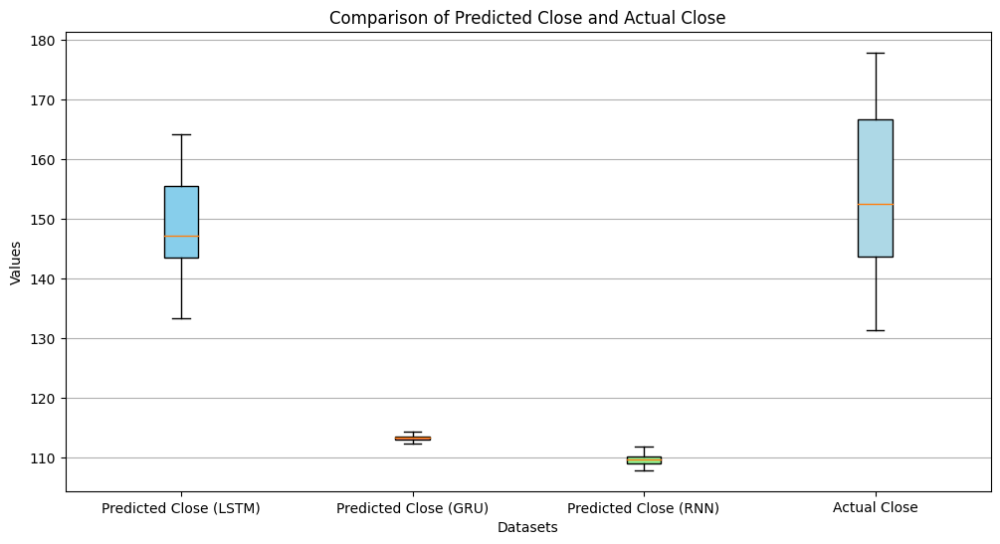

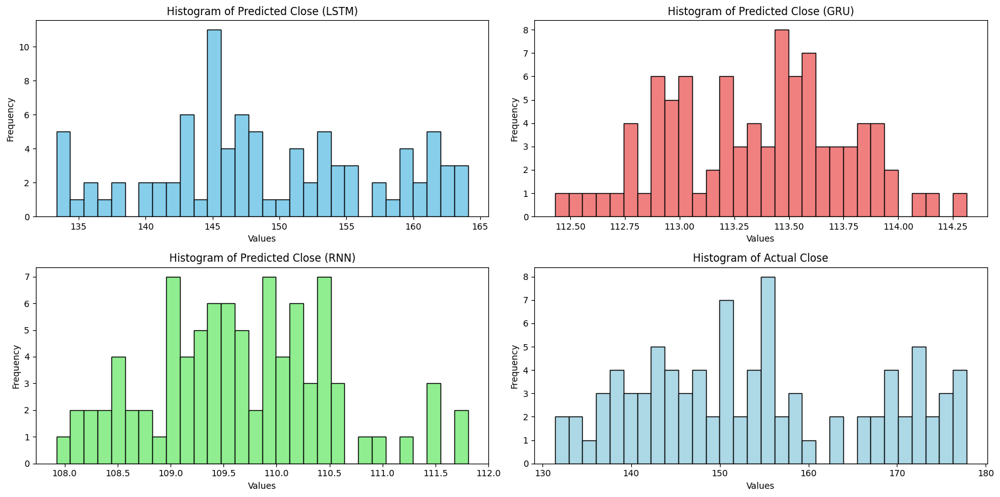

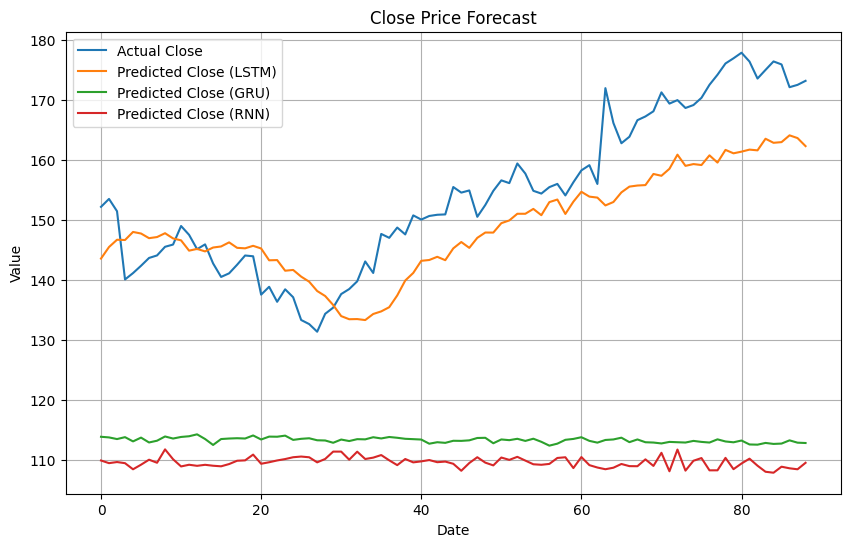

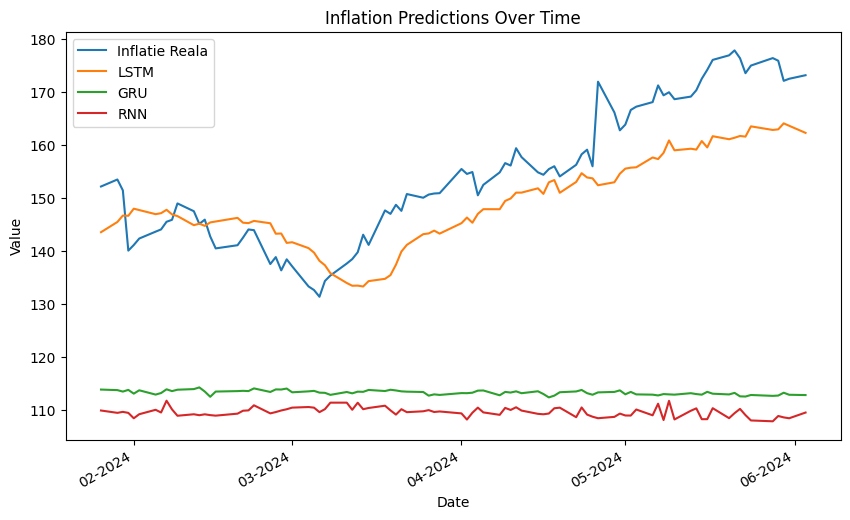

LSTM Model: MAE = 7.3200, MSE = 70.7755, RMSE = 8.4128
GRU Model: MAE = 40.7865, MSE = 1837.5922, RMSE = 42.8671
RNN Model: MAE = 44.4617, MSE = 2155.0245, RMSE = 46.4222


In [ ]:
df['Close_anterior'] = df.shift(1)['Close']
df.head(5)

#df['modificare_close'] = df.progress_apply(
 # lambda row: 0 if np.isnan(row.Close_anterior) else row.Close - row.Close_anterior,
  #axis=1)

df['modificare_close'] = df.progress_apply(
    lambda row: 0 if np.isnan(row.Close_anterior) else (row.Close - row.Close_anterior)/row.Close_anterior,
    axis=1)

rows = []

for _, row in tqdm(df.iterrows(), total=df.shape[0]):
  row_data = dict(
      Close = row.Close,
      Conditional_Volatility = row.Conditional_Variance,
      Modificare_Close = row.modificare_close
  )

  rows.append(row_data)

features_df = pd.DataFrame(rows)
features_df.index = df.index
print(features_df.head())
features_df.shape

train_size = int(len(features_df) * 0.80)
train_size

train_df, test_df = features_df[:train_size], features_df[train_size +1:]
train_df.shape, test_df.shape

scaler = MinMaxScaler(feature_range=(-1,1))
scaler = scaler.fit(train_df)

train_df = pd.DataFrame(scaler.transform(train_df), index=train_df.index, columns=train_df.columns)

test_df = pd.DataFrame(scaler.transform(test_df), index=test_df.index, columns=test_df.columns)

print(train_df.head(5))
test_df.head(5)

def create_sequences(input_data: pd.DataFrame, target_column, sequence_length):

  sequences = []
  data_size = len(input_data)

  for i in tqdm(range(data_size - sequence_length)):
    sequence = input_data[i:i+sequence_length]
    label_position = i + sequence_length
    label= input_data.iloc[label_position][target_column]
    sequences.append((sequence, label))

  return sequences

SEQUENCE_LENGTH = 10

train_sequences = create_sequences(train_df, "Close", SEQUENCE_LENGTH)
test_sequences = create_sequences(test_df, 'Close', SEQUENCE_LENGTH)

train_sequences[0][0]

len(train_sequences), len(test_sequences)

#146 - nr original training
#(146 - 138) == SEQUENCE_LENGTH
#corect

class CloseDataset(Dataset):

  def __init__(self, sequences):
    self.sequences = sequences

  def __len__(self):
    return len(self.sequences)

  def __getitem__(self, idx):
    sequence, label = self.sequences[idx]
    return dict(
        sequence=torch.Tensor(sequence.to_numpy()),
        label=torch.tensor(label).float()
    )

class CloseDataModule(pl.LightningDataModule):
  def __init__ (
      self, train_sequences, test_sequences, batch_size = 10
  ):
    super().__init__()
    self.train_sequences = train_sequences
    self.test_sequences = test_sequences
    self.batch_size = batch_size

  def setup(self, stage=None):
    self.train_dataset = CloseDataset(self.train_sequences)
    self.test_dataset = CloseDataset(self.test_sequences)

  def train_dataloader(self):
    return DataLoader(
        self.train_dataset,
        batch_size=self.batch_size,
        shuffle=False,#Discutabil daca fals sau adevarat, depinde de set ul de date,
        num_workers=2 #depinde de puterea procesorului
    )

  def val_dataloader(self):
    return DataLoader(
        self.test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=1
    )

N_EPOCHS = 10
BATCH_SIZE = 10

data_module = CloseDataModule(train_sequences, test_sequences, batch_size=BATCH_SIZE)
data_module.setup()

train_dataset = CloseDataset(train_sequences)

for item in train_dataset:
  print(item['sequence'].shape)
  print(item['label'].shape)
  print(item['label'])
  break

class ClosePredictionLSTM(nn.Module):
    def __init__(self, n_features, n_hidden=120, n_layers=2):
        super(ClosePredictionLSTM, self).__init__()

        self.n_hidden = n_hidden

        self.lstm = nn.LSTM(
            input_size=n_features,
            hidden_size=n_hidden,
            batch_first=True,
            num_layers=n_layers,
            dropout=0.1
        )

        self.regressor = nn.Linear(n_hidden, 1)

    def forward(self, x):
        self.lstm.flatten_parameters()  # Ensures efficient memory use for LSTM layers

        _, (hidden, _) = self.lstm(x)
        out = hidden[-1]

        return self.regressor(out)


class ClosePredictionGRU(nn.Module):
    def __init__(self, n_features, n_hidden=84, n_layers=2):
        super(ClosePredictionGRU, self).__init__()

        self.n_hidden = n_hidden

        self.gru = nn.GRU(
            input_size=n_features,
            hidden_size=n_hidden,
            batch_first=True,
            num_layers=n_layers,
            dropout=0.1
        )

        self.regressor = nn.Linear(n_hidden, 1)

    def forward(self, x):
        self.gru.flatten_parameters()
        _, hidden = self.gru(x)
        out = hidden[-1]
        return self.regressor(out)


class ClosePredictionRNN(nn.Module):
    def __init__(self, n_features, n_hidden=84, n_layers=2):
        super(ClosePredictionRNN, self).__init__()

        self.n_hidden = n_hidden

        self.rnn = nn.RNN(
            input_size=n_features,
            hidden_size=n_hidden,
            batch_first=True,
            num_layers=n_layers,
            dropout=0.1
        )

        self.regressor = nn.Linear(n_hidden, 1)

    def forward(self, x):
        self.rnn.flatten_parameters()
        _, hidden = self.rnn(x)
        out = hidden[-1]
        return self.regressor(out)


import torch.optim as optim
class ClosePredictor(pl.LightningModule):

  def __init__(self, model_type, n_features: int):
    super().__init__()
    if model_type == 'LSTM':
        self.model = ClosePredictionLSTM(n_features)
    elif model_type == 'GRU':
        self.model = ClosePredictionGRU(n_features)
    elif model_type == 'RNN':
        self.model = ClosePredictionRNN(n_features)
    else:
        raise ValueError(f"Unsupported model type: {model_type}")
    self.criterion = nn.MSELoss()

  def forward(self, x, labels=None):
    output = self.model(x)
    loss = 0
    if labels is not None:
      loss = self.criterion(output, labels.unsqueeze(dim=1))
    return loss, output

  def training_step(self, batch, batch_idx):
    sequences = batch['sequence']
    labels = batch['label']
    loss, outputs = self(sequences, labels)
    self.log('train_loss', loss, prog_bar=True, logger=True)
    return loss

  def validation_step(self, batch, batch_idx):
    sequences = batch['sequence']
    labels = batch['label']
    loss, outputs = self(sequences, labels)
    self.log('val_loss', loss, prog_bar=True, logger=True)
    return loss

  def test_step(self, batch, batch_idx):
    sequences = batch['sequence']
    labels = batch['label']
    loss, outputs = self(sequences, labels)
    self.log('test_loss', loss, prog_bar=True, logger=True)
    return loss

  def configure_optimizers(self):
    return optim.AdamW(self.parameters(), lr=0.0001)

train_df.shape

for item in data_module.train_dataloader():
  print(item['sequence'].shape)
  print(item['label'].shape)
  print(item['label'])
  break


%load_ext tensorboard
%tensorboard --logdir ./lightning_logs

checkpoint_callback = ModelCheckpoint(
    dirpath='checkpoints',
    filename='best-checkpoint',
    save_top_k=1,
    verbose=True,
    monitor='val_loss',
    mode='min'
)

# Logger
logger = TensorBoardLogger('lightning_logs', name='Pret Inchidere GOOGL')

# EarlyStopping callback
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=2)

# Trainer configuration
trainer = pl.Trainer(
    logger=logger,
    callbacks=[checkpoint_callback, early_stopping_callback],  # No need to explicitly add a ProgressBar
    max_epochs=10,  # Replace N_EPOCHS with a specific number or define N_EPOCHS
    gpus=0,  # Use None or 0 if GPU is not available
    enable_progress_bar=True  # Default is True, showing the progress bar
)

model = ClosePredictor('LSTM',n_features=train_df.shape[1])
model_GRU = ClosePredictor('GRU',n_features=train_df.shape[1])
model_RNN = ClosePredictor('RNN',n_features=train_df.shape[1])

trainer.fit(model, data_module)
trained_model = model
trainer.fit(model_GRU, data_module)
trained_GRU = model_GRU
trainer.fit(model_RNN, data_module)
trained_RNN = model_RNN

test_dataset = CloseDataset(test_sequences)

predictions = []
labels = []

for item in tqdm(test_dataset):
  sequence = item['sequence']
  label = item['label']

  _, output = trained_model(sequence.unsqueeze(dim=0))
  predictions.append(output.item())
  labels.append(label.item())

  predictions_GRU = []
  labels_GRU = []

for item in tqdm(test_dataset):
  sequence = item['sequence']
  label = item['label']

  _, output = trained_GRU(sequence.unsqueeze(dim=0))
  predictions_GRU.append(output.item())
  labels_GRU.append(label.item())

  predictions_RNN = []
  labels_RNN = []

for item in tqdm(test_dataset):
  sequence = item['sequence']
  label = item['label']

  _, output = trained_RNN(sequence.unsqueeze(dim=0))
  predictions_RNN.append(output.item())
  labels_RNN.append(label.item())

predictions_array = np.array(predictions).reshape(-1, 1)
labels_array = np.array(labels).reshape(-1, 1)

# Inverse transform the predictions and labels
predictions_descaled = scaler.inverse_transform(np.hstack([predictions_array] * train_df.shape[1]))[:, 0]
labels_descaled = scaler.inverse_transform(np.hstack([labels_array] * train_df.shape[1]))[:, 0]

# Output the results
print("Original Predictions (Scaled):", predictions[:5])
print("Original Labels (Scaled):", labels[:5])
print("Descaled Predictions:", predictions_descaled[:5])
print("Descaled Labels:", labels_descaled[:5])

predictions_array_GRU = np.array(predictions_GRU).reshape(-1, 1)
labels_array_GRU = np.array(labels_GRU).reshape(-1, 1)

# Inverse transform the predictions and labels
predictions_descaled_GRU = scaler.inverse_transform(np.hstack([predictions_array_GRU] * train_df.shape[1]))[:, 0]
labels_descaled_GRU = scaler.inverse_transform(np.hstack([labels_array_GRU] * train_df.shape[1]))[:, 0]

# Output the results
print("Original Predictions (Scaled):", predictions_GRU[:5])
print("Original Labels (Scaled):", labels_GRU[:5])
print("Descaled Predictions:", predictions_descaled_GRU[:5])
print("Descaled Labels:", labels_descaled_GRU[:5])

predictions_array_RNN = np.array(predictions_RNN).reshape(-1, 1)
labels_array_RNN = np.array(labels_RNN).reshape(-1, 1)

# Inverse transform the predictions and labels
predictions_descaled_RNN = scaler.inverse_transform(np.hstack([predictions_array_RNN] * train_df.shape[1]))[:, 0]
labels_descaled_RNN = scaler.inverse_transform(np.hstack([labels_array_RNN] * train_df.shape[1]))[:, 0]

# Output the results
print("Original Predictions (Scaled):", predictions_RNN[:5])
print("Original Labels (Scaled):", labels_RNN[:5])
print("Descaled Predictions:", predictions_descaled_RNN[:5])
print("Descaled Labels:", labels_descaled_RNN[:5])


plt.figure(figsize=(12, 6))

plt.boxplot(predictions_descaled, positions=[1], labels=['Predicted Close (LSTM)'], patch_artist=True, boxprops=dict(facecolor='skyblue'))
plt.boxplot(predictions_descaled_GRU, positions=[2], labels=['Predicted Close (GRU)'], patch_artist=True, boxprops=dict(facecolor='lightcoral'))
plt.boxplot(predictions_descaled_RNN, positions=[3], labels=['Predicted Close (RNN)'], patch_artist=True, boxprops=dict(facecolor='lightgreen'))
plt.boxplot(labels_descaled, positions=[4], labels=['Actual Close'], patch_artist=True, boxprops=dict(facecolor='lightblue'))

plt.xlabel('Datasets')
plt.ylabel('Values')
plt.title('Comparison of Predicted Close and Actual Close')
plt.grid(axis='y')

plt.show()


plt.figure(figsize=(16, 8))

# Histogram for test_predictions
plt.subplot(2, 2, 1)
plt.hist(predictions_descaled, bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of Predicted Close (LSTM)')
plt.xlabel('Values')
plt.ylabel('Frequency')

# Histogram for test_predictions_GRU
plt.subplot(2, 2, 2)
plt.hist(predictions_descaled_GRU, bins=30, color='lightcoral', edgecolor='black')
plt.title('Histogram of Predicted Close (GRU)')
plt.xlabel('Values')
plt.ylabel('Frequency')

# Histogram for test_predictions_RNN
plt.subplot(2, 2, 3)
plt.hist(predictions_descaled_RNN, bins=30, color='lightgreen', edgecolor='black')
plt.title('Histogram of Predicted Close (RNN)')
plt.xlabel('Values')
plt.ylabel('Frequency')

# Histogram for new_y_test
plt.subplot(2, 2, 4)
plt.hist(labels_descaled, bins=30, color='lightblue', edgecolor='black')
plt.title('Histogram of Actual Close')
plt.xlabel('Values')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))

# Plot each series
true_line, = plt.plot(labels_descaled, label='Actual Close')
pred_line, = plt.plot(predictions_descaled, label='Predicted Close (LSTM)')
gru_line, = plt.plot(predictions_descaled_GRU, label='Predicted Close (GRU)')
rnn_line, = plt.plot(predictions_descaled_RNN, label='Predicted Close (RNN)')

# Title and labels
plt.title('Close Price Forecast', fontsize=12)
plt.xlabel('Date')
plt.ylabel('Value')

# Legend
plt.legend(fontsize=10)

# Grid
plt.grid(True)

# Show plot
plt.show()

num_predictions = len(predictions_descaled)

# Extract the last 'num_predictions' indices from df_results
# Assuming 'df' is your DataFrame with the date index and you have the predictions
index_for_predictions = df.index[-num_predictions:]

# Create DataFrames or Series for predictions with the correct index
predictions_series = pd.Series(predictions_descaled, index=index_for_predictions)
predictions_gru_series = pd.Series(predictions_descaled_GRU, index=index_for_predictions)
predictions_rnn_series = pd.Series(predictions_descaled_RNN, index=index_for_predictions)
labels_series = pd.Series(labels_descaled, index=index_for_predictions)

# Create the plot
plt.figure(figsize=(10, 6))

# Plot each series using the Series with the date index
plt.plot(labels_series, label='Inflatie Reala')
plt.plot(predictions_series, label='LSTM')
plt.plot(predictions_gru_series, label='GRU')
plt.plot(predictions_rnn_series, label='RNN')

# Set the date format on the x-axis
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%m-%Y'))
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator())  # You can change the locator as needed

# Rotate and align the date labels
plt.gcf().autofmt_xdate()

# Show the plot
plt.show()

mae_lstm = mean_absolute_error(predictions_descaled, labels_descaled)
mse_lstm = mean_squared_error(predictions_descaled, labels_descaled)
rmse_lstm = np.sqrt(mse_lstm)


mae_gru = mean_absolute_error(predictions_descaled_GRU, labels_descaled)
mse_gru = mean_squared_error(predictions_descaled_GRU, labels_descaled)
rmse_gru = np.sqrt(mse_gru)

mae_rnn = mean_absolute_error(predictions_descaled_RNN, labels_descaled)
mse_rnn = mean_squared_error(predictions_descaled_RNN, labels_descaled)
rmse_rnn = np.sqrt(mse_rnn)

print(f"LSTM Model: MAE = {mae_lstm:.4f}, MSE = {mse_lstm:.4f}, RMSE = {rmse_lstm:.4f}")
print(f"GRU Model: MAE = {mae_gru:.4f}, MSE = {mse_gru:.4f}, RMSE = {rmse_gru:.4f}")
print(f"RNN Model: MAE = {mae_rnn:.4f}, MSE = {mse_rnn:.4f}, RMSE = {rmse_rnn:.4f}")

# Set the x-axis to start from January 1, 2022
#plt.xlim(pd.Timestamp('2022-01-01'), df_results.index.max())

# Set the y-axis to show only values higher than 2
#None means no upper limit, adjusts automatically based on data
